## General Behavior of Complexity Measures In Different Dynamical Regimes

This notebook delves into the intricate behavior of complexity measures across diverse dynamical regimes. Through detailed simulations, complexity calculations, and vivid visualizations, it provides a comprehensive overview of how each complexity measure performs under varying data types and noise levels, paving the way for deeper analysis. 
### Summary of Analyses

1. **Totally Random Data Analysis**:
   - **Statistical Complexity**: Simulated random binary data up to length 2000, calculated statistical complexity for memory lengths \\(\lambda\\) from 1 to 5, and compared variations.
   - **Lempel-Ziv Complexity**: Computed Lempel-Ziv complexity for the same data and analyzed variations with data length.

2. **Logistic Map with White Noise**:
   - **Simulation**: Generated logistic map data for various \\(r\\) values, added different levels of white noise.
   - **Complexity Calculation**: Computed both complexities for different segment lengths and \\(r\\) values, and analyzed the impact of white noise.

3. **Multivariate Autoregressive (MVAR) to Python.
   - **Simulation and Analysis**: Generated data using the Python MVAR model, computed both complexities, and analyzed the results.the results.e the results.

### Import

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.io
import scipy.stats as stats
import zlib
import os
import pandas as pd

from numpy import *
from numpy.linalg import *
from scipy import signal
from scipy.signal import hilbert
from scipy.stats import ranksums, ttest_ind, entropy, pearsonr
from scipy.io import savemat, loadmat
from random import *
from itertools import combinations
from pylab import *
from copy import deepcopy
from pyentrp import entropy as ent

### Statistical Complexity

In [5]:
def calculate(istring: str, dl: int, sigma: float = 0.05, method: str = "overlapping",
                                     states_provided: bool = False, return_states: bool = False):
    """
    Find the (forwards) Statistical Complexity of an input string for given lambda and sigma values
    """
    #if states are not provided, find them, otherwise declare it
    if(type(states_provided)==bool):
        #first, find all states from the input string and the probabilities of presents
        initial_states = find_states(istring,dl,method=method)
        #next, collapse states which have similar probability distributions
        refined_states = collapse_states(initial_states,dl,sigma)
    else:
        #collapse the states based purely on keynames (already done)
        initial_states,refined_states = states_provided,states_provided
    #convert this into a list of probabilities
    probs = collapse_past(refined_states)
    #create an array of logbase2 probabilities for use in the calculation
    logprobs = np.log2(probs)
    #sum the negative of probability * log2 probability of each state to get the statistical complexity
    complexity = 0.0
    for i in range(len(probs)):
        complexity -= probs[i]*logprobs[i]
    #if states are not desired, only return complexity
    if(return_states==False):
        return complexity
    else:
        return complexity,refined_states,initial_states

def calculate_multi(istrings,dl: int, sigma: float = 0.05):
    """
    Find the (forwards) Statistical Complexity values for an array of strings
    """
    output = []
    for string in istrings:
        output.append(calculate(string,dl,sigma))
    return output

def calculate_bd(istring: str, dl: int, sigma: float = 0.05, method: str ="overlapping",
                              record_states: bool = False):
    """
    Find the forwards, reverse and bidirectional statistical complexity for a string
    """
    #find statistical complexity of forward string and the refined states
    f_sc,f_states,f_states_raw = calculate(istring,dl,sigma,return_states=True,method=method)
    #find complexity of backwards string
    b_sc,b_states,b_states_raw = calculate(istring[::-1],dl,sigma,return_states=True,method=method)
    #collapse the states of forward and reverse complexity based purely on key names
    bd_s = collapse_keys(f_states,b_states)
    #find complexity of bi-directional machine
    bd_sc,bd_states,bd_states_raw = calculate("",dl,sigma,states_provided = bd_s,return_states = True)
    if(record_states==False):
        return f_sc,b_sc,bd_sc
    else:
        return f_sc,b_sc,bd_sc,len(f_states),len(b_states),len(bd_states),len(f_states_raw),len(b_states_raw),len(bd_states_raw)

#Find multiple statistical complexities for forwards, reverse and bidirectional
def calculate_bd_multi(istrings,dl: int, sigma: float = 0.05):
    """
    Find the forwards, reverse and bidirectional Statistical Complexity values for an array of strings
    """
    output = []
    for string in istrings:
        output.append(calculate_bd(string,dl,sigma))
    return output

#input string, desired lambda
def find_states(istring: str, dl: int, method: str = "nonoverlapping"):
    """
    Find the states present in a given input string, outputting the past states, their frequency, and their present state distributions
    """
    #variables used
    i,output_dict = 0,{}
    ## main loop of identifying past and present states
    # Option 1: Non Overlapping
    if(method=="nonoverlapping"):
        while(i+(dl*2)<len(istring)):
            past,present = istring[i:i+dl],istring[i+dl:i+(2*dl)]
            if(past not in output_dict):
                output_dict.update({past: {present:1,"total":1}})
            else:
                if(present not in output_dict[past]):
                    output_dict[past].update({present:1})
                else:
                    output_dict[past][present]+=1
                output_dict[past]["total"]+=1
            i+=dl
    #Option 2: Overlapping
    else:
        while(i+dl+1<len(istring)):
            past,present = istring[i:i+dl],istring[i+1:i+1+dl]
            if(past not in output_dict):
                output_dict.update({past: {present:1,"total":1}})
            else:
                if(present not in output_dict[past]):
                    output_dict[past].update({present:1})
                else:
                    output_dict[past][present]+=1
                output_dict[past]["total"]+=1
            i+=1
    # The last state discovery (main loop misses the final state that can be found)
    try:
        if(method=="nonoverlapping"):
            past,present = istring[i:i+dl],istring[i+dl:i+(2*dl)]
        else:
            past,present = istring[i:i+dl],istring[i+1:i+1+dl]
        if(past not in output_dict):
            output_dict.update({past: {present:1,"total":1}})
        else:
            if(present not in output_dict[past]):
                output_dict[past].update({present:1})
            else:
                output_dict[past][present]+=1
            output_dict[past]["total"]+=1
    except:
        pass
    #collapse counts into probabilities with total counts
    for past in output_dict:
        for present in output_dict[past]:
            if(present!="total"):
                output_dict[past][present]/=output_dict[past]["total"]
    return output_dict

def collapse_states(odict: dict, dl: int, sigma: float = 0.1):
    """
    Collapse a dictionary of state counts into practical states based on a permitted difference sigma
    """
    # Newdict is the collapsed dictionary, temp is used to override newdict when necessary,
    # done_checker is a dictionary used to record the keys already compared
    newdict,temp,done_checker = deepcopy(odict),False,{}
    while(True):
        # If temp is not a boolean, i.e. it's become a dictionary, override newdict
        if(type(temp)!=bool):
            newdict = deepcopy(temp)
            temp = False
        for past1 in newdict:
            if(past1 not in done_checker):
                done_checker[past1] = {}
            for past2 in newdict:
                if(past1!=past2):
                    if(past2 not in done_checker[past1]):
                        done_checker[past1][past2] = True
                    else:
                        # If these states have already been checked, don't bother checking them again
                        continue
                    # If the difference is less than sigma, merge these states and break the past2 loop
                    if(calculate_difference(newdict[past1],newdict[past2])<sigma):
                        temp = merge_states(newdict,past1,past2,dl)
                        break
            # If the dictionary must be updated, break the past1 loop
            if(type(temp)!=bool):
                break
        # If temp is still a boolean, i.e. there was no merging of states in this loop, break the main loop
        if(type(temp)==bool):
            break
    return newdict

def calculate_difference(past1: dict, past2: dict):
    """
    Calculate the difference between two past states' present state distributions
    """
    difference = -np.inf
    # Cycle through past 1 and check for max differences
    for present in past1:
        # Ensure this check isn't being performed on the total state count
        if(present!="total"):
            if(present not in past2):
                difference = max(difference,past1[present])
            else:
                difference = max(difference,abs(past1[present]-past2[present]))
    # Cycle through past 2
    for present in past2:
        if(present!="total"):
            if(present not in past1):
                difference = max(difference,past2[present])
    return difference

def merge_states(odict: dict, past1: dict, past2: dict, dl: int):
    """
    Merge 2 states and their present state distributions, creating a new state key in a standardised manner
    """
    nprobs = {}
    for present in odict[past1]:
        if(present in odict[past2]):
            nprobs.update({present:(odict[past1][present]+odict[past2][present])/2})
        else:
            nprobs.update({present:odict[past1][present]/2})
    for present in odict[past2]:
        if(present not in odict[past1]):
            nprobs.update({present:odict[past2][present]/2})
    nprobs.update({"total":odict[past1]["total"]+odict[past2]["total"]})
    #create a sorted version of the two pasts combined
    temp,to_sort = past1+past2,[]
    for i in range(int(len(temp)/dl)):
        to_sort.append(temp[(i*dl):(i*dl)+dl])
    newkey = ""
    while(len(to_sort)>0):
        newkey += to_sort.pop(to_sort.index(min(to_sort)))
    #add the new key and remove the old ones
    ndict = deepcopy(odict)
    ndict.update({newkey:nprobs})
    del ndict[past1]
    del ndict[past2]
    return ndict

#collapse dictionary of past states and future states into an array of probabilities of the past states
def collapse_past(odict):
    """
    Collapse a dictionary of past states with present state distribtuions into an array of probabilities of the past states
    """
    probs,i,total = np.zeros(len(odict),dtype=float),0,0
    for past in odict:
        probs[i] += odict[past]["total"]
        total += odict[past]["total"]
        i+=1
    return probs/total

def collapse_keys(d1: dict, d2: dict):
    """
    Merge 2 dictionaries of past states with present state distributions
    Note: keys present in both dictionaries lose their probability distributions and only the "total" key remains,
          but this is all that is needed by the point they are merged
    """
    ndict = {}
    for key in d1:
        # as longer keys are created and sorted in a standard way, they are all standardised
        temp = False
        if(key in d2):
            #if the key is in d2, add the two together and mark this has been done
            ndict.update({key:{"total":d1[key]["total"]+d2[key]["total"]}})
            temp = True
        #if no variant of the key was found in d2, add the key as-is
        if(temp==False):
            ndict.update({key:d1[key]})
    for key in d2:
        if(key not in ndict):
            ndict.update({key:d2[key]})
    return ndict

def probs_to_complexity(probs):
    """
    Calculate the Statistical Complexity given an array of past state probabilities
    """
    #create an array of logbase2 probabilities for use in the calculation
    logprobs = np.log2(probs)
    # Correct any 0-probabilities to become 0 rather than infinity
    for i in range(len(logprobs)):
        if(probs[i]==0): logprobs[i] = 0.
    #sum the negative of probability * log2 probability of each state to get the statistical complexity
    complexity = 0.0
    for i in range(len(probs)):
        complexity -= probs[i]*logprobs[i]
    return complexity

def binarise(data,mode="median"):
    """
    Binarise an array of continuous numbers into an array of 0's and 1's (as a string)
    """
    if(type(data)==list or type(data)==tuple):
        data=np.array(data,dtype=float)
    if(isinstance(data,np.ndarray)==False):
        return "Unusable datatype {}".format(type(data))
    if(mode=="median"):
        threshold=np.median(data)
    elif(mode=="mean"):
        threshold=np.mean(data)
    output = np.zeros([len(data)],dtype=int)
    for i in range(len(data)):
        if(data[i]>=threshold):
            output[i]+=1
    # Convert to string
    outstr = ""
    for element in output:
        outstr += str(element)
    return outstr

def multi_binarise(matrix,mode="median"):
    """
    Binarise a 2D matrix (used for calculating multiple statistical complexities)    
    """
    print("Binarising data...")
    # Convert to numpy matrix
    if(type(matrix)==list or type(matrix)==tuple):
        matrix=np.array(matrix,dtype=object)
    output = []
    percent_check = 0.
    for i in range(len(matrix)):
        output.append(binarise(matrix[i],mode))
        # Output progress
        if((i+1)/float(len(matrix))>=percent_check/100.):
            print("{}% of data binarised".format(\
                round(((i+1)/len(matrix))*100,1)))
            percent_check+=10.
    print("Data Binarised")
    return np.array(output, dtype = object)

## Lempel-Ziv complexity (LZc)

In [7]:
'''
Python code to compute LZc complexity measure as described in "Complexity of multi-dimensional spontaneous EEG decreases during propofol induced general anaesthesia"

Author: m.schartner@sussex.ac.uk
Date: 09.12.14

To compute Lempel-Ziv complexity for continuous multidimensional time series X, where rows are time series (minimum 2), and columns are observations, type the following in ipython: 
 
execfile('CompMeasures.py')
LZc(X)
'''

def Pre(X):
 '''
 Detrend and normalize input data, X a multidimensional time series
 '''
 ro,co=shape(X)
 Z=zeros((ro,co))
 for i in range(ro):
  Z[i,:]=signal.detrend(X[i,:]-mean(X[i,:]), axis=0)
 return Z


##########
'''
LZc - Lempel-Ziv Complexity, column-by-column concatenation
'''
##########

def cpr(string):
    """
    Lempel-Ziv-Welch compression of binary input string, e.g., string='0010101'.
    It outputs the size of the dictionary of binary words.
    """
    d = {}
    w = ''
    for c in string:
        wc = w + c
        if wc in d:
            w = wc
        else:
            d[wc] = wc
            w = c
    return len(d)

def LZc_binary(string):
    """
    Compute LZ complexity for a binary string and normalize it using a shuffled result.
    """
    # Shuffling the string
    shuffled_string = list(string)
    np.random.shuffle(shuffled_string)
    shuffled_string = ''.join(shuffled_string)
    
    # Calculate complexities
    original_complexity = cpr(string)
    shuffled_complexity = cpr(shuffled_string)
    
    # Normalize the complexity by the shuffled result if shuffled_complexity is not zero
    if shuffled_complexity != 0:
        normalized_complexity = original_complexity / float(shuffled_complexity)
    else:
        normalized_complexity = original_complexity

    return normalized_complexity


def str_col(X):
 '''
 Input: Continuous multidimensional time series
 Output: One string being the binarized input matrix concatenated comlumn-by-column
 '''
 ro,co=shape(X)
 TH=zeros(ro)
 M=zeros((ro,co))
 for i in range(ro):
  M[i,:]=abs(hilbert(X[i,:]))
  TH[i]=mean(M[i,:])

 s=''
 for j in xrange(co):
  for i in xrange(ro):
   if M[i,j]>TH[i]:
    s+='1'
   else:
    s+='0'

 return s

def LZc(X):
 '''
 Compute LZc and use shuffled result as normalization
 '''
 X=Pre(X)
 SC=str_col(X)
 M=list(SC)
 shuffle(M)
 w=''
 for i in range(len(M)):
  w+=M[i]
 return cpr(SC)/float(cpr(w))

## Behaviour on Totally Random Data

In [9]:
# Function to generate random binary sequences
def generate_random_binary_sequences(num_sequences, length):
    return np.random.randint(0, 2, size=(num_sequences, length)).astype(str)

# Function to calculate Statistical Complexity for a single sequence
def calculate_statistical_complexity(sequence, lambda_val, sigma_val):
    # We will convert the numpy array to a string and pass it to the calculate function
    binary_string = ''.join(sequence)
    return calculate(binary_string, lambda_val, sigma=sigma_val)

# Function to calculate Lempel-Ziv complexity for a single sequence
def calculate_lz_complexity(sequence):
    # Convert sequence to required format if necessary and use the LZc function
    binary_string = ''.join(sequence)
    return LZc_binary(binary_string)  # Adjusted to use the new function


# Function to simulate and collect results
def simulate_complexities(sequence_lengths, lambda_values, sigma_values):
    results = {}
    for length in sequence_lengths:
        sequences = generate_random_binary_sequences(100, length)
        for lambda_val in lambda_values:
            for sigma_val in sigma_values:
                complexities = [calculate_statistical_complexity(seq, lambda_val, sigma_val) for seq in sequences]
                lz_complexities = [calculate_lz_complexity(seq) for seq in sequences]
                results[(length, lambda_val, sigma_val)] = (complexities, lz_complexities)
    return results

# Parameters to vary
sequence_lengths = [500, 1000, 1500, 2000]  # Different sequence lengths
lambda_values = [1, 2, 3, 4, 5]             # Different lambda values
sigma_values = [0.01, 0.05, 0.1]            # Different sigma values

# Run the simulation
results = simulate_complexities(sequence_lengths, lambda_values, sigma_values)

## Visualisation
### 1. Statistical Complexity 

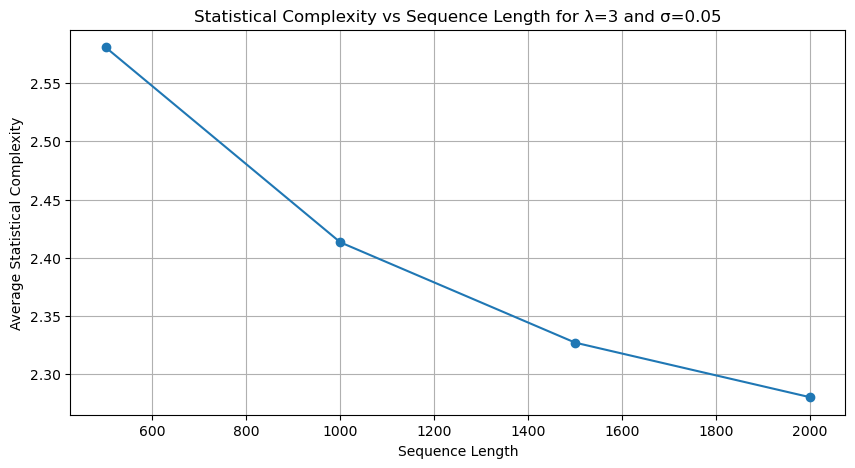

In [11]:
# Example: Plotting Statistical Complexity for lambda=3 and sigma=0.05 across different sequence lengths
lambda_val = 3
sigma_val = 0.05
complexity_values = [np.mean(results[(length, lambda_val, sigma_val)][0]) for length in sequence_lengths]

plt.figure(figsize=(10, 5))
plt.plot(sequence_lengths, complexity_values, marker='o', linestyle='-')
plt.title(f'Statistical Complexity vs Sequence Length for λ={lambda_val} and σ={sigma_val}')
plt.xlabel('Sequence Length')
plt.ylabel('Average Statistical Complexity')
plt.grid(True)
plt.show()

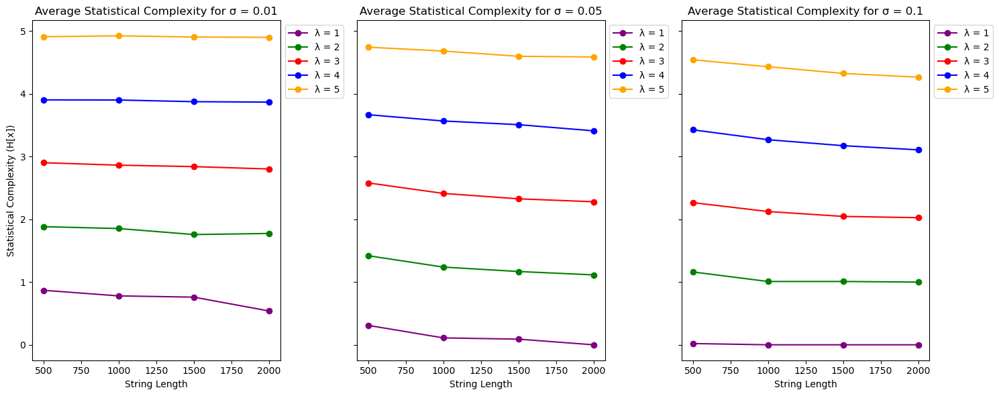

In [12]:
# Parameters and settings
sequence_lengths = [500, 1000, 1500, 2000]
lambda_values = [1, 2, 3, 4, 5]
sigma_values = [0.01, 0.05, 0.1]

fig, axes = plt.subplots(1, 3, figsize=(15, 6), sharey=True)  # 3 subplots for each sigma value

# Colors for different lambda values
colors = ['purple', 'green', 'red', 'blue', 'orange']

# Plotting
for i, sigma_val in enumerate(sigma_values):
    ax = axes[i]
    for j, lambda_val in enumerate(lambda_values):
        complexities = [np.mean(results[(length, lambda_val, sigma_val)][0]) for length in sequence_lengths]
        ax.plot(sequence_lengths, complexities, marker='o', linestyle='-', color=colors[j], label=f'λ = {lambda_val}')
    ax.set_title(f'Average Statistical Complexity for σ = {sigma_val}')
    ax.set_xlabel('String Length')
    if i == 0:
        ax.set_ylabel('Statistical Complexity (H[x])')
    #ax.grid(True)
    ax.legend(loc='upper left', bbox_to_anchor=(1, 1))  # Adjust as needed

plt.tight_layout()
plt.show()

### 2. LZc Visualization 

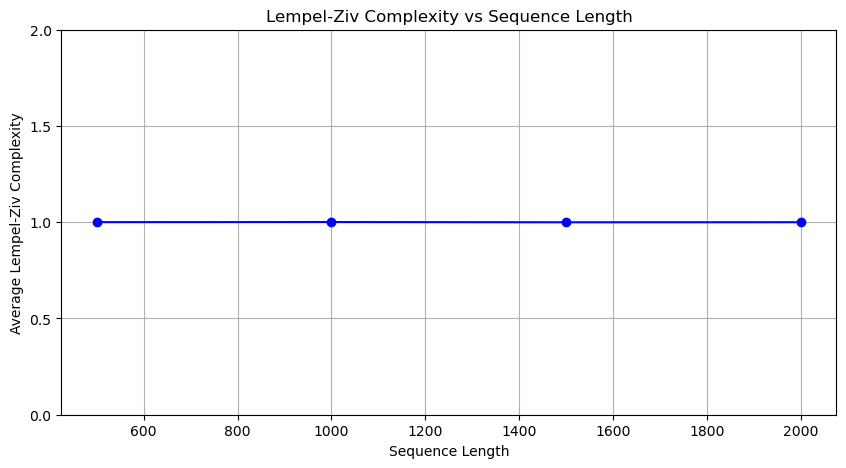

In [14]:
# Assuming the same setup from before
sequence_lengths = [500, 1000, 1500, 2000]  # Different sequence lengths

# Example: Extracting LZc values for each length
lz_complexities = {length: np.mean([results[(length, lambda_val, sigma_val)][1] for lambda_val in lambda_values for sigma_val in sigma_values]) for length in sequence_lengths}

# Create the plot
plt.figure(figsize=(10, 5))
plt.plot(sequence_lengths, list(lz_complexities.values()), marker='o', linestyle='-', color='blue')
plt.title('Lempel-Ziv Complexity vs Sequence Length')
plt.xlabel('Sequence Length')
plt.ylabel('Average Lempel-Ziv Complexity')
plt.ylim(0, 2)  # Set y-axis limits from 0 to 2
plt.yticks(np.arange(0, 2.5, 0.5))  # Set y-axis ticks from 0 to 2 in steps of 0.5
plt.grid(True)
plt.show()

This shows that LZc is fairly constant as segment length varies.

### Combine Plot

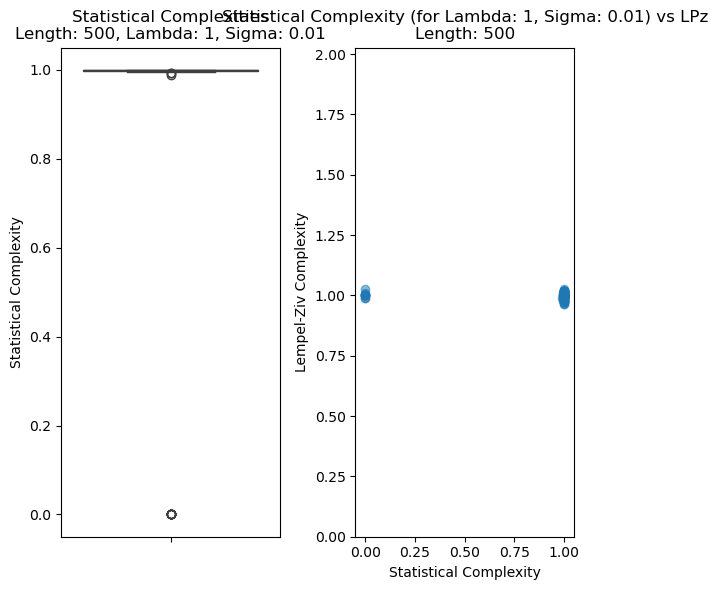

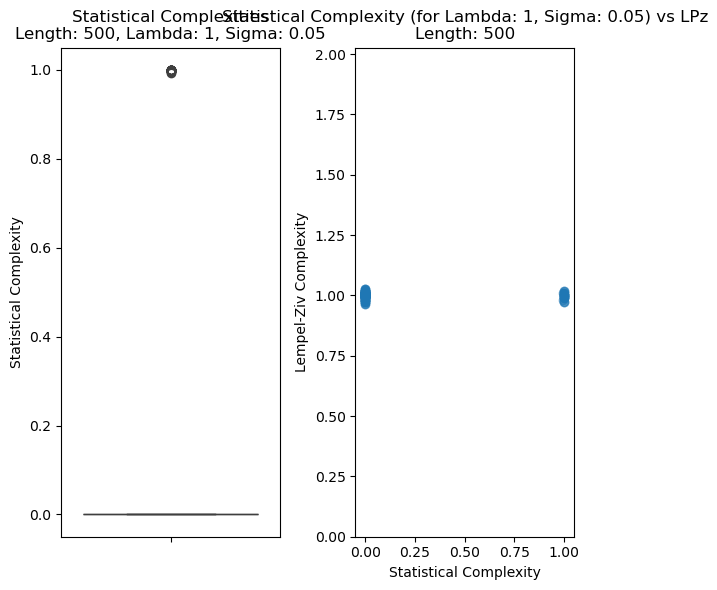

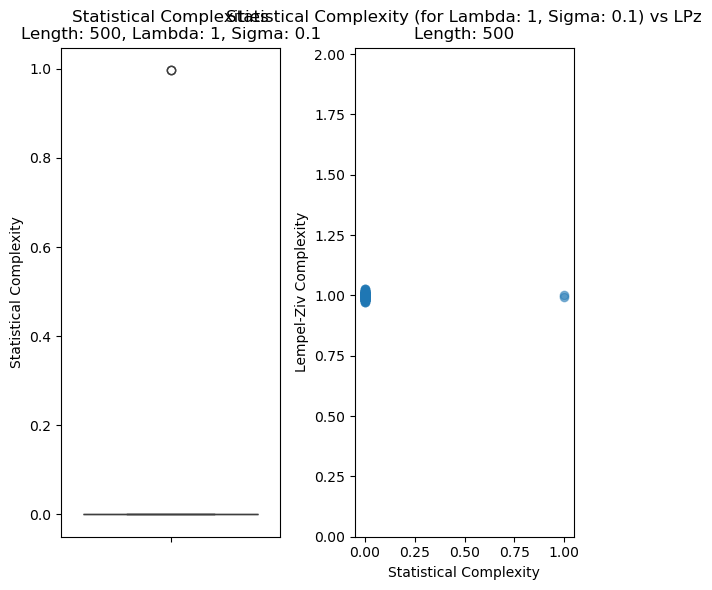

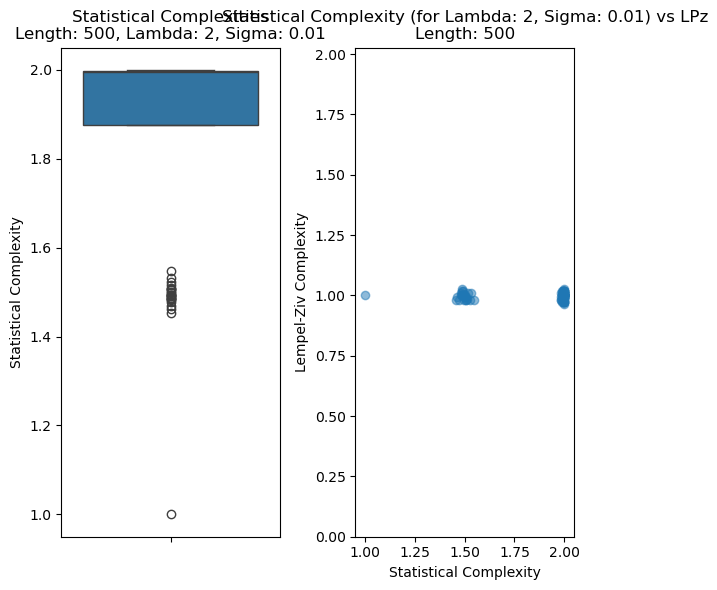

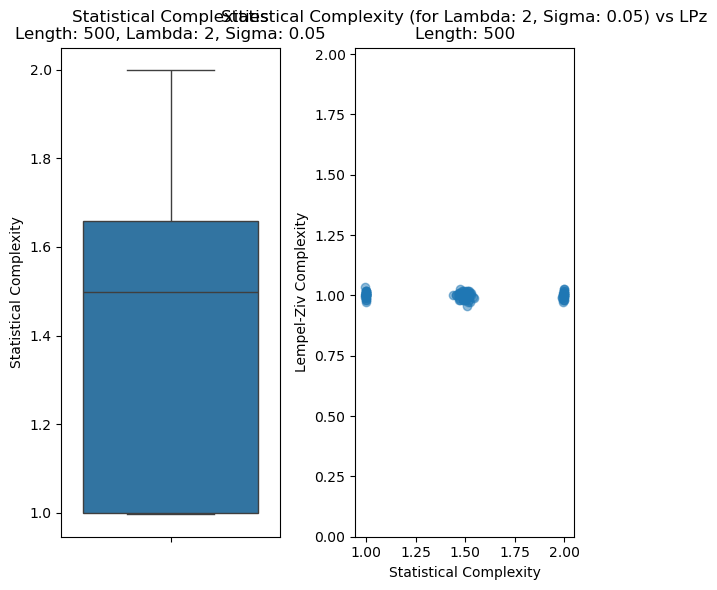

...

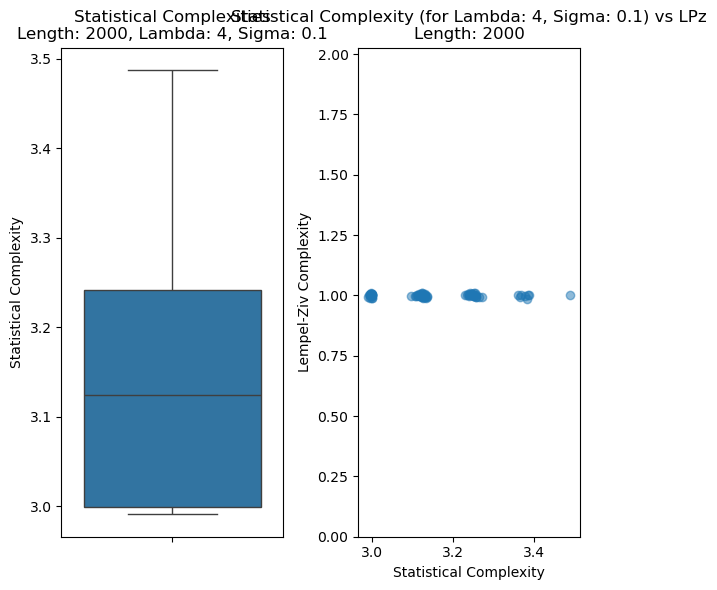

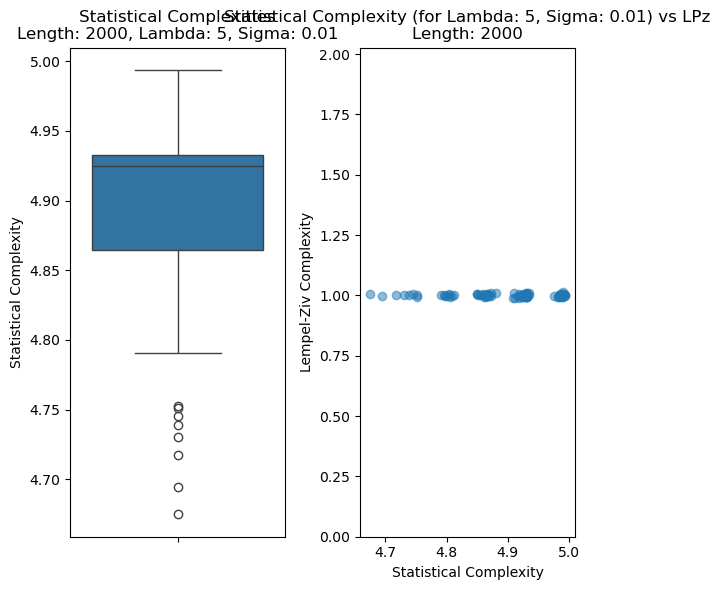

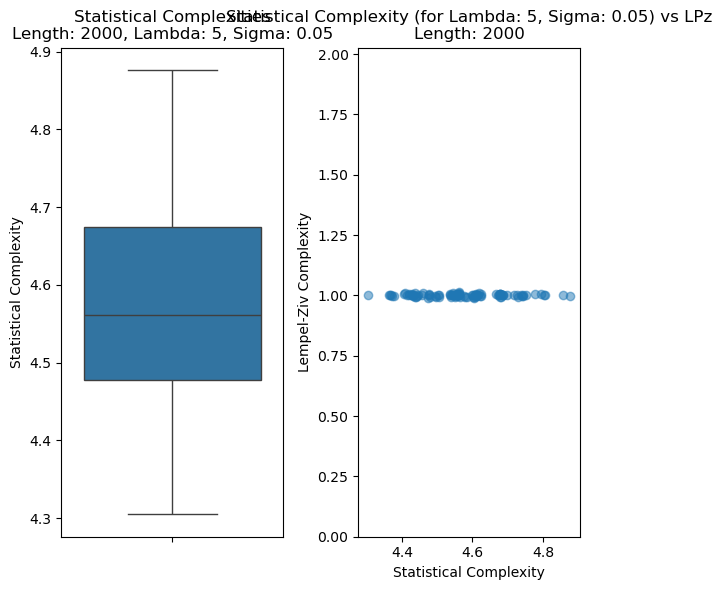

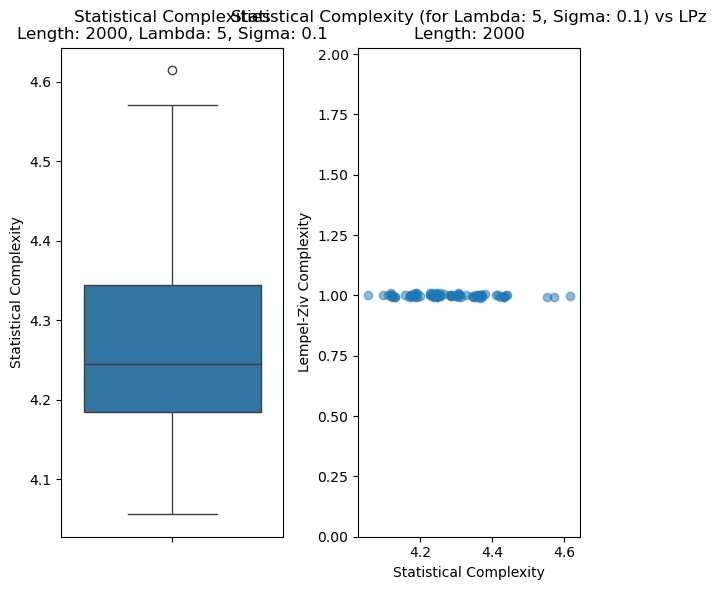

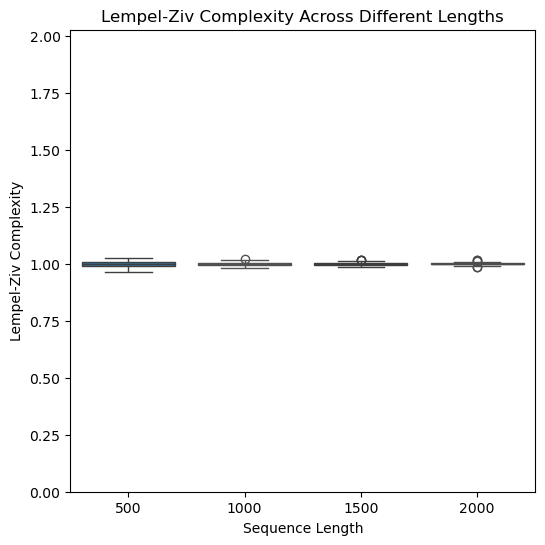

In [16]:
# Generate random binary sequences
def generate_random_binary_sequences(num_sequences, length):
    return np.random.randint(0, 2, size=(num_sequences, length)).astype(str)

# Calculate Statistical Complexity for a single sequence
def calculate_statistical_complexity(sequence, lambda_val, sigma_val):
    binary_string = ''.join(sequence)
    return calculate(binary_string, lambda_val, sigma=sigma_val)

# Calculate Lempel-Ziv complexity for a single sequence
def calculate_lz_complexity(sequence):
    binary_string = ''.join(sequence)
    return LZc_binary(binary_string)

# Simulate and collect results
def simulate_complexities(sequence_lengths, lambda_values, sigma_values):
    results = {}
    for length in sequence_lengths:
        sequences = generate_random_binary_sequences(100, length)
        for lambda_val in lambda_values:
            for sigma_val in sigma_values:
                complexities = [calculate_statistical_complexity(seq, lambda_val, sigma_val) for seq in sequences]
                lz_complexities = [calculate_lz_complexity(seq) for seq in sequences]
                results[(length, lambda_val, sigma_val)] = (complexities, lz_complexities)
    return results

# Visualization function
def visualize_results(results):
    # Extract Lempel-Ziv complexities for different sequence lengths
    lz_complexities_by_length = {}
    for (length, _, _), (_, lz_complexities) in results.items():
        if length not in lz_complexities_by_length:
            lz_complexities_by_length[length] = lz_complexities
    
    # Iterate through the results to create plots
    for (length, lambda_val, sigma_val), (stat_complexities, lz_complexities) in results.items():
        plt.figure(figsize=(6, 6))
        
        # Box plot for statistical complexities
        plt.subplot(1, 2, 1)
        sns.boxplot(y=stat_complexities)
        plt.title(f'Statistical Complexities\nLength: {length}, Lambda: {lambda_val}, Sigma: {sigma_val}')
        plt.ylabel('Statistical Complexity')
        
        # Scatter plot for statistical vs Lempel-Ziv complexities
        plt.subplot(1, 2, 2)
        plt.scatter(stat_complexities, lz_complexities, alpha=0.5)
        plt.ylim(0, max([max(lzc) for lzc in lz_complexities_by_length.values()]) + 1)
        plt.title(f'Statistical Complexity (for Lambda: {lambda_val}, Sigma: {sigma_val}) vs LPz\nLength: {length}')
        plt.xlabel('Statistical Complexity')
        plt.ylabel('Lempel-Ziv Complexity')
        
        plt.tight_layout()
        plt.show()
    
    # Separate plot for Lempel-Ziv complexity across different lengths
    plt.figure(figsize=(6, 6))
    for length, lz_complexities in lz_complexities_by_length.items():
        sns.boxplot(x=[length]*len(lz_complexities), y=lz_complexities)
    plt.title('Lempel-Ziv Complexity Across Different Lengths')
    plt.xlabel('Sequence Length')
    plt.ylabel('Lempel-Ziv Complexity')
    plt.ylim(0, max([max(lzc) for lzc in lz_complexities_by_length.values()]) + 1)
    plt.show()

# Parameters to vary
sequence_lengths = [500, 1000, 1500, 2000]  # Different sequence lengths
lambda_values = [1, 2, 3, 4, 5]             # Different lambda values
sigma_values = [0.01, 0.05, 0.1]            # Different sigma values

# Run the simulation
results = simulate_complexities(sequence_lengths, lambda_values, sigma_values)

# Visualize the results
visualize_results(results)

### Summarise Plot

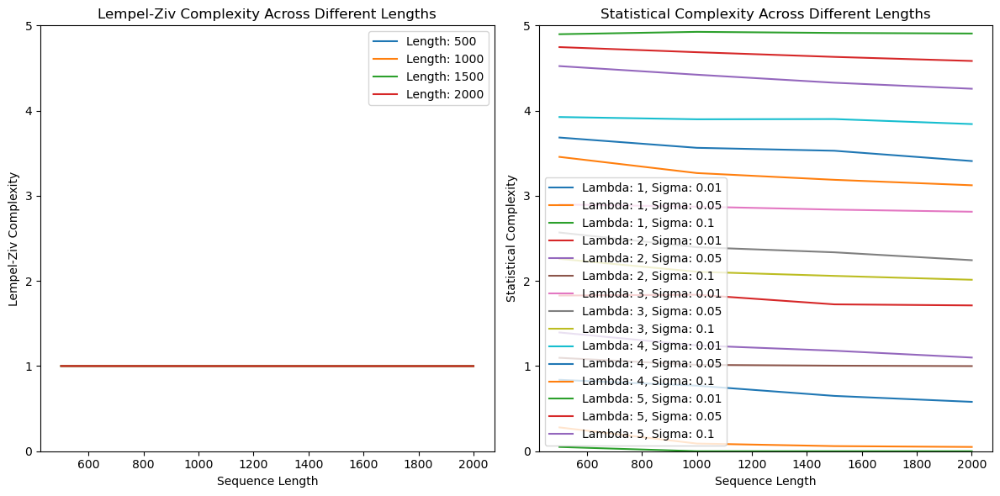

In [18]:
# Visualization function for line plots
def visualize_line_plot(results, sequence_lengths, lambda_values, sigma_values):
    # Average Lempel-Ziv complexities by length
    avg_lz_complexities = {length: [] for length in sequence_lengths}
    avg_stat_complexities = {(length, lambda_val, sigma_val): [] for length in sequence_lengths for lambda_val in lambda_values for sigma_val in sigma_values}
    
    for (length, lambda_val, sigma_val), (stat_complexities, lz_complexities) in results.items():
        avg_lz_complexities[length].append(np.mean(lz_complexities))
        avg_stat_complexities[(length, lambda_val, sigma_val)].append(np.mean(stat_complexities))
    
    plt.figure(figsize=(12, 6))
    
    # Plotting Lempel-Ziv complexity
    plt.subplot(1, 2, 1)
    for length in sequence_lengths:
        plt.plot(sequence_lengths, [np.mean(avg_lz_complexities[length]) for length in sequence_lengths], label=f'Length: {length}')
    plt.title('Lempel-Ziv Complexity Across Different Lengths')
    plt.xlabel('Sequence Length')
    plt.ylabel('Lempel-Ziv Complexity')
    plt.ylim(0, 5)  # Set y-axis limit to 0 - 5
    plt.legend()
    
    # Plotting Statistical Complexity
    plt.subplot(1, 2, 2)
    for (lambda_val, sigma_val) in [(lv, sv) for lv in lambda_values for sv in sigma_values]:
        plt.plot(sequence_lengths, [np.mean(avg_stat_complexities[(length, lambda_val, sigma_val)]) for length in sequence_lengths], label=f'Lambda: {lambda_val}, Sigma: {sigma_val}')
    plt.title('Statistical Complexity Across Different Lengths')
    plt.xlabel('Sequence Length')
    plt.ylabel('Statistical Complexity')
    plt.ylim(0, 5)  # Set y-axis limit to 0 - 5
    plt.legend()
    
    plt.tight_layout()
    plt.show()

# Parameters to vary
sequence_lengths = [500, 1000, 1500, 2000]  # Different sequence lengths
lambda_values = [1, 2, 3, 4, 5]             # Different lambda values
sigma_values = [0.01, 0.05, 0.1]            # Different sigma values

# Run the simulation
results = simulate_complexities(sequence_lengths, lambda_values, sigma_values)

# Visualize the results
visualize_line_plot(results, sequence_lengths, lambda_values, sigma_values)

## Behavior on Logistic Map

The logistic map is defined by the equation:
\\[ x_{n+1} = r \cdot x_n \cdot (1 - x_n) \\]
where \\( x \\) ranges between 0 and 1, and \\( r \\) is the growth rate parameter.

In [21]:
def logistic_map(r, x0, n):
    """ Generate n iterations of the Logistic Map starting from x0 with growth rate r. """
    x = np.zeros(n)
    x[0] = x0
    for i in range(1, n):
        x[i] = r * x[i-1] * (1 - x[i-1])
    return x

### Add White Noise
Add normally distributed white noise to the logistic map data:

In [23]:
def add_white_noise(data, noise_level):
    """ Add white noise to data. """
    noise = np.random.normal(0, noise_level, size=data.shape)
    return data + noise

### Compute Complexities
Binarize the data first for complexity calculations:

In [25]:
def binarize_data(data, threshold):
    """ Binarize numerical data based on a threshold. """
    return (data > threshold).astype(int)

### 4. Simulation and Visualization
Perform simulations for different values of \\( r \\), noise levels, and segment lengths. Visualize the results:

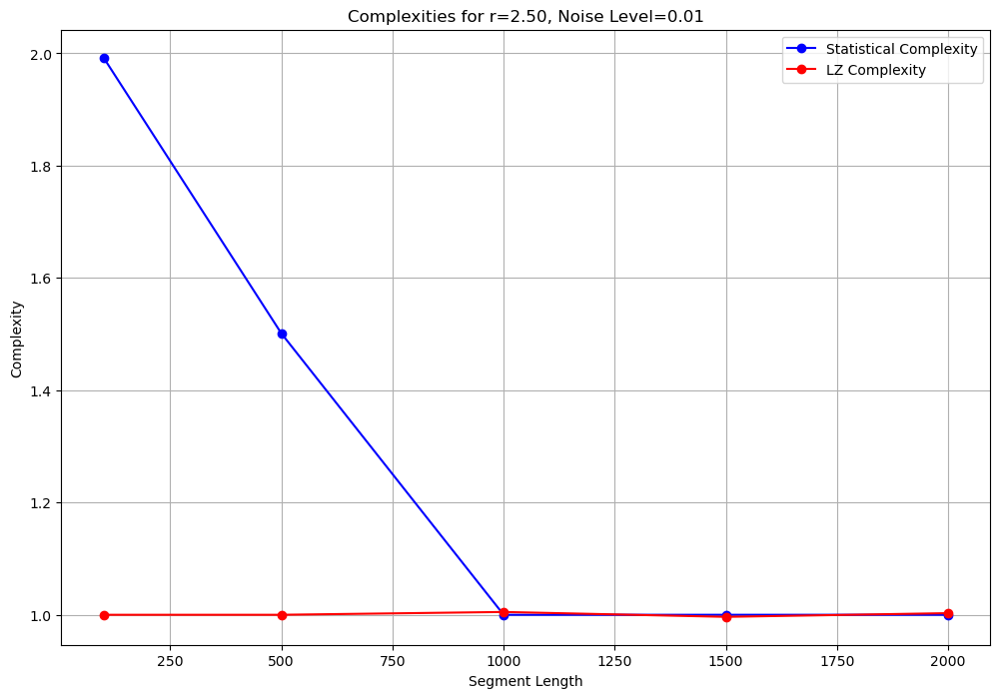

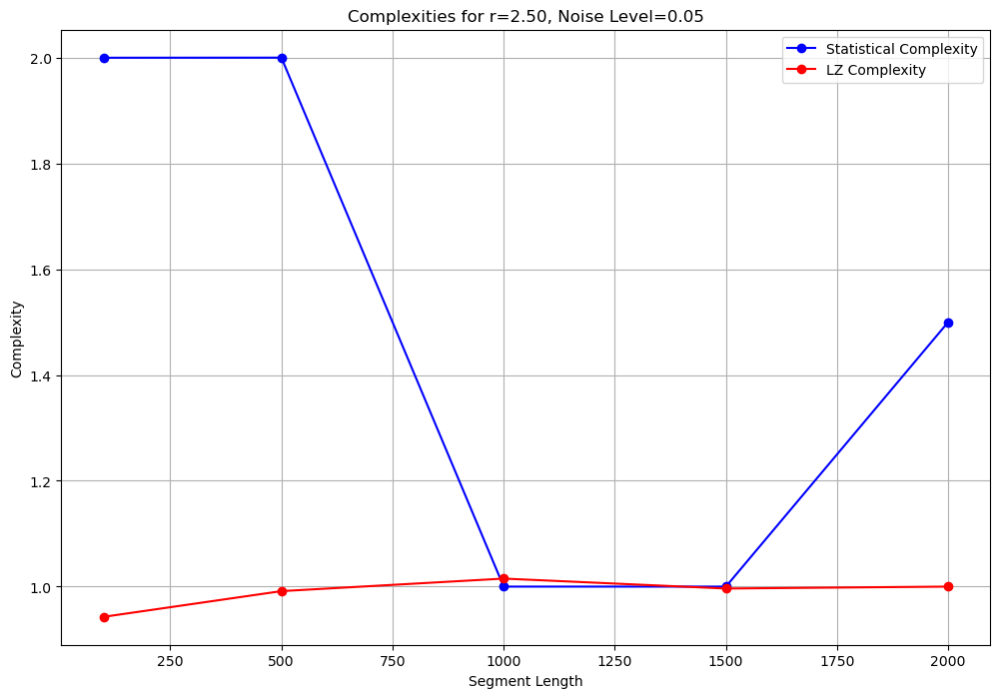

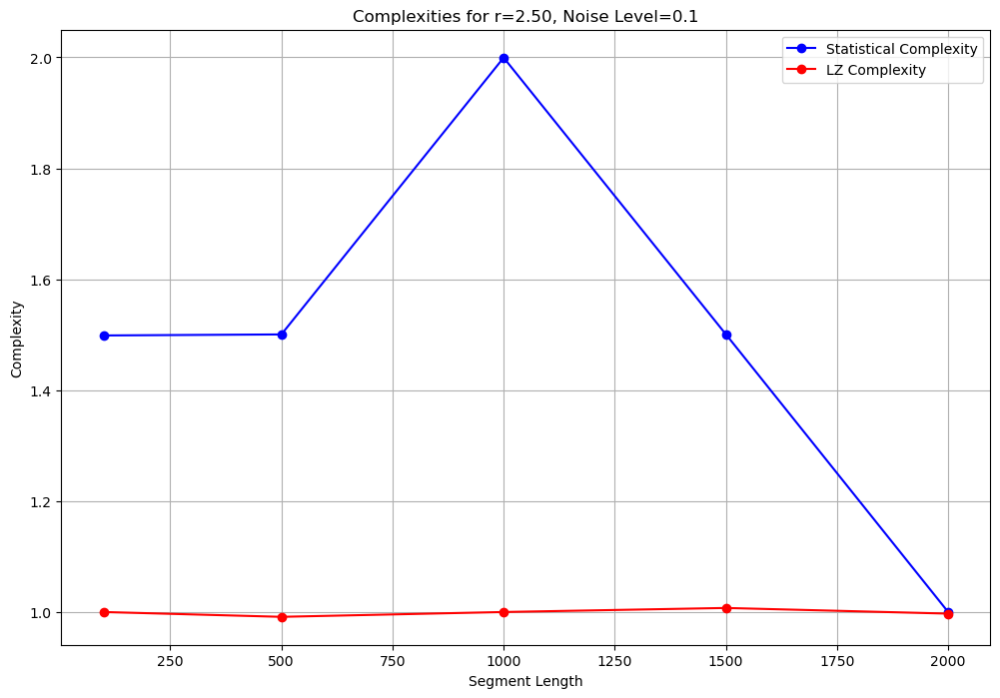

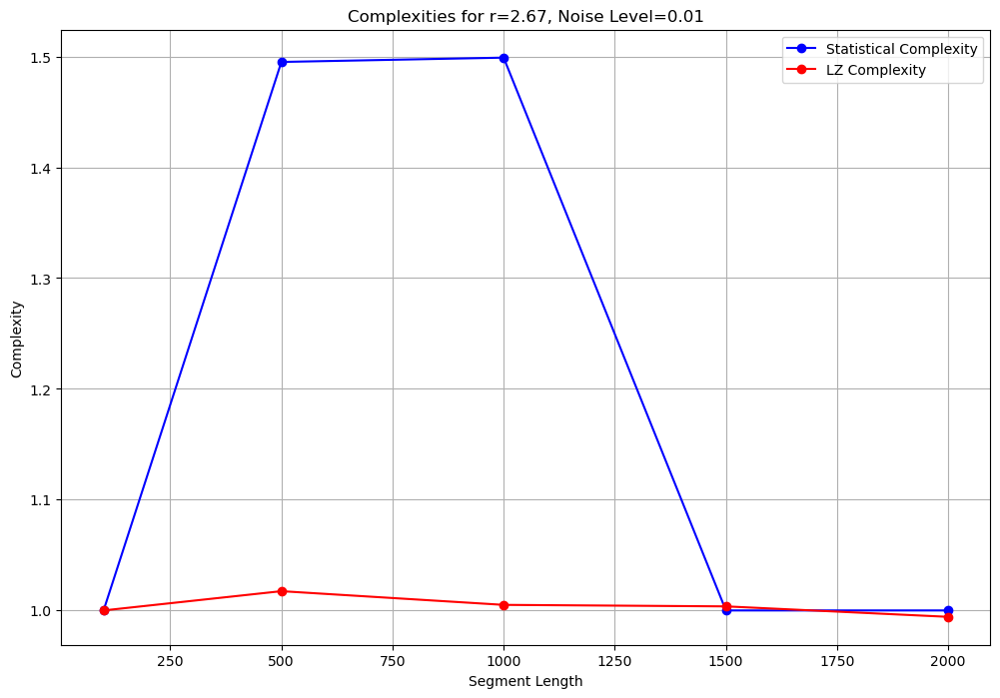

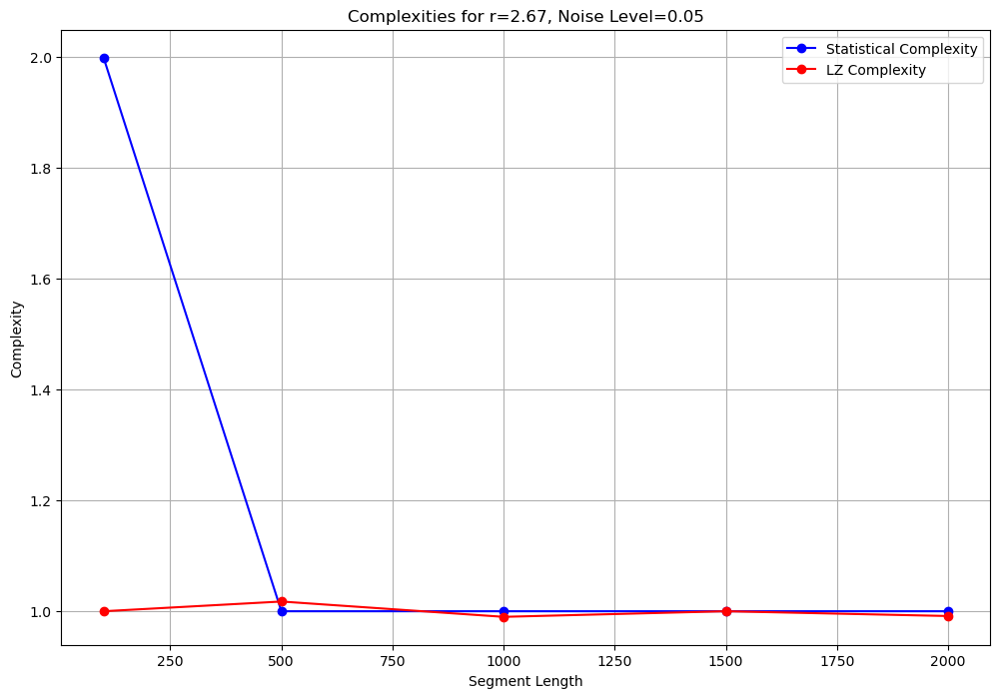

...

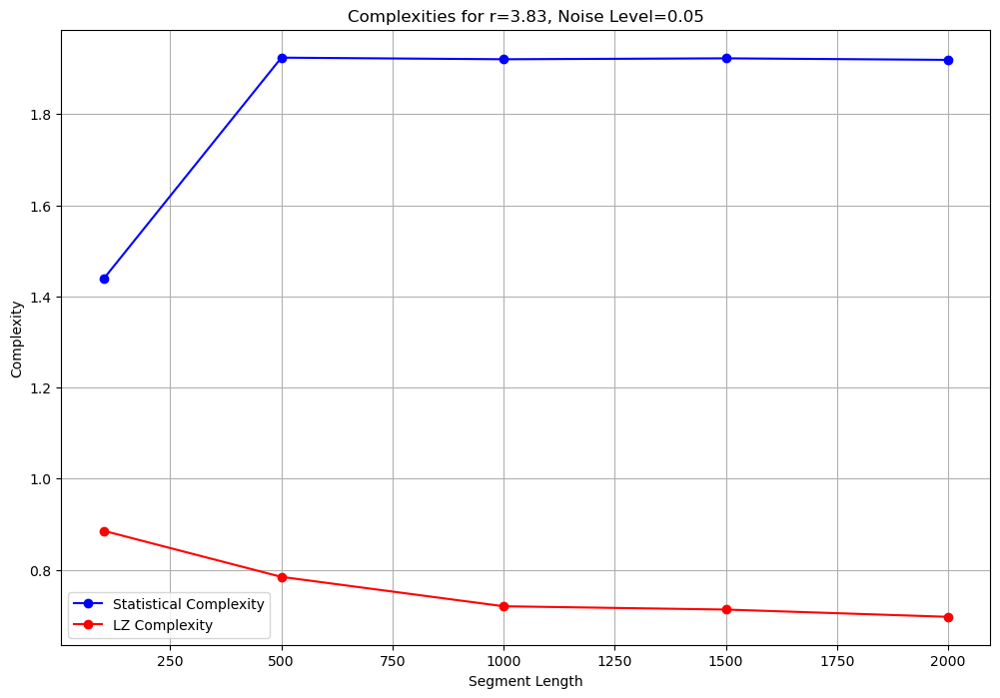

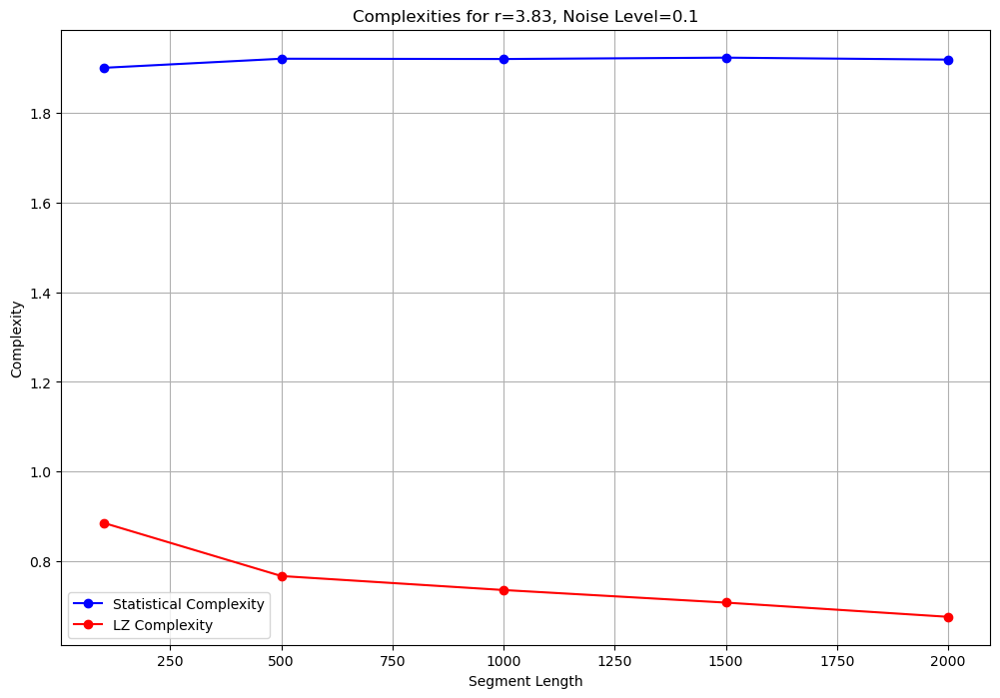

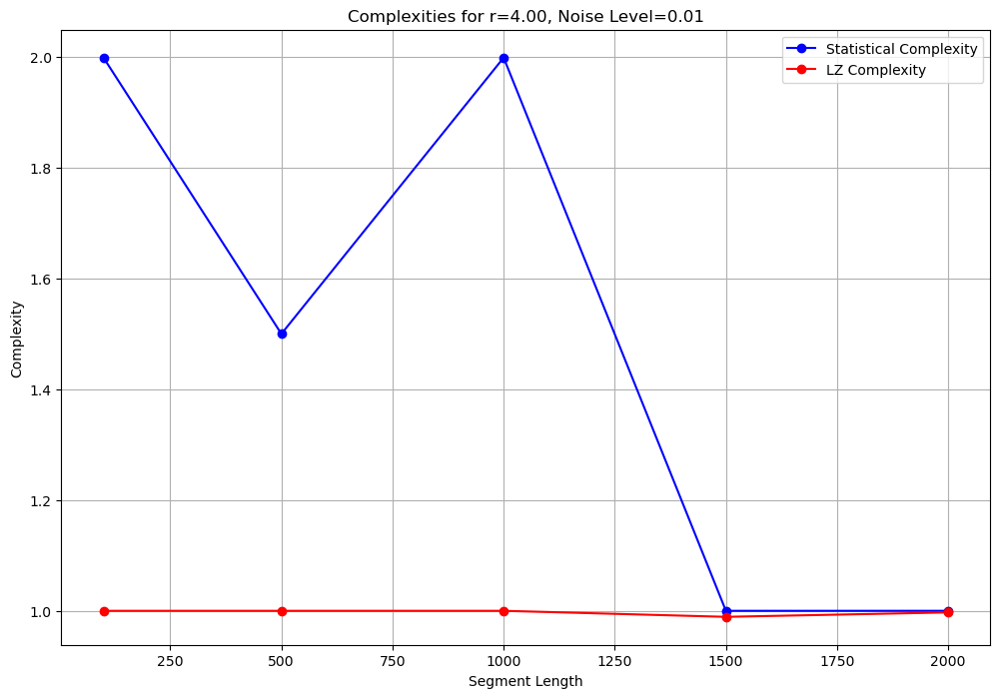

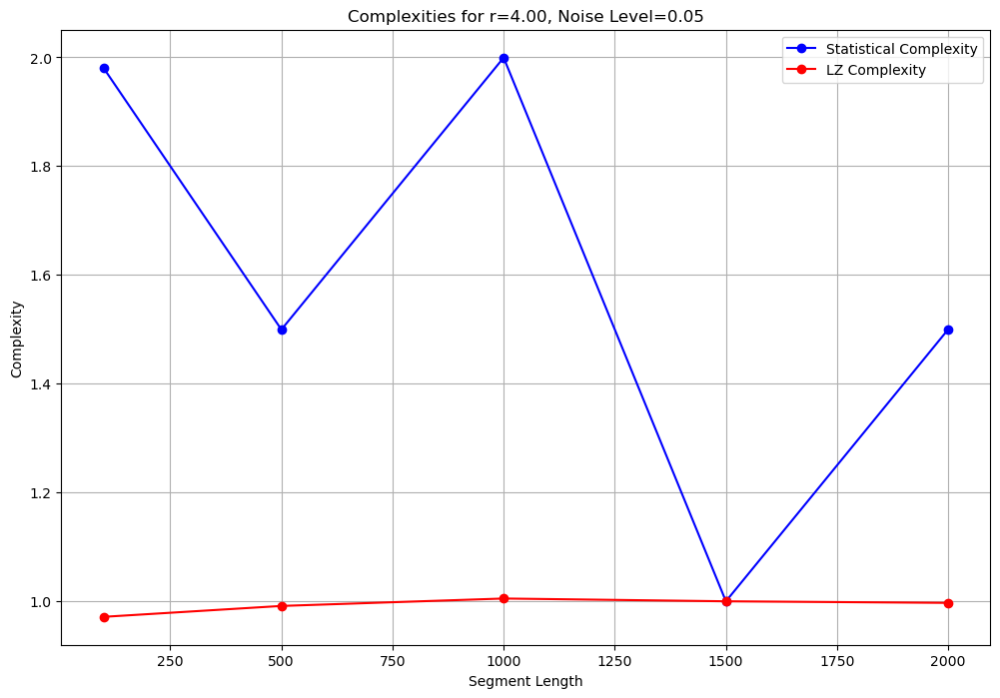

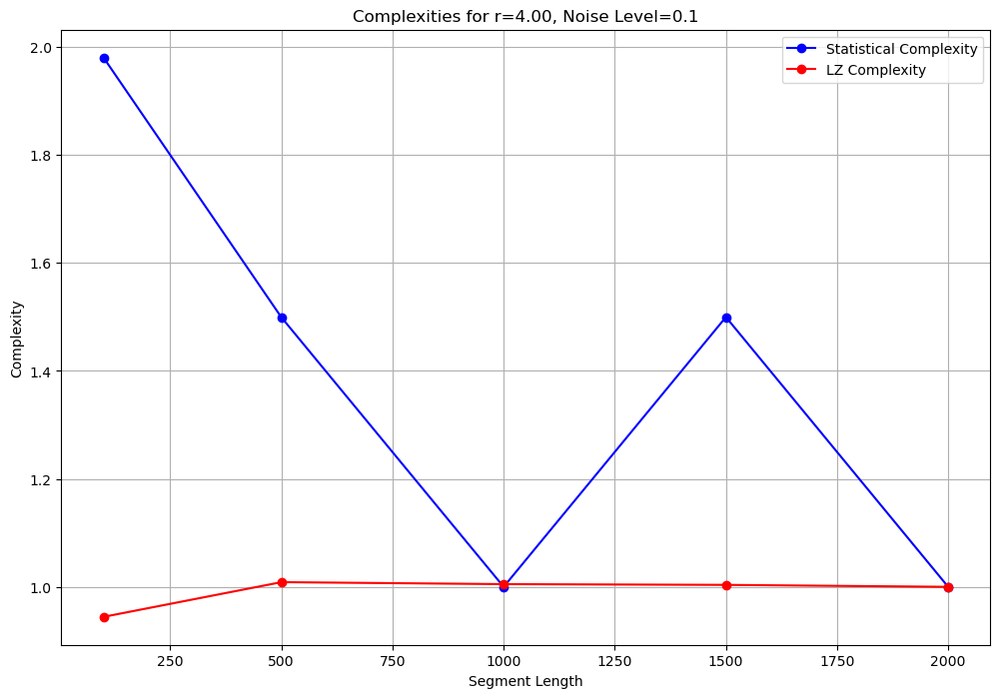

In [27]:
# Adjust `calculate_statistical_complexity` function for the logistic data
def calculate_statistical_complexity(binary_data, dl, sigma):
    """Calculates the statistical complexity of a binary string."""
    return calculate(binary_data, dl, sigma=sigma)

# Parameters
r_values = np.linspace(2.5, 4.0, 10)  # Range of r values in the chaotic regime
noise_levels = [0.01, 0.05, 0.1]      # Different levels of noise
segment_lengths = [100, 500, 1000, 1500, 2000]    # Different data segment lengths

# Simulation and plotting
for r in r_values:
    for noise_level in noise_levels:
        plt.figure(figsize=(12, 8))
        stat_complexities = []
        lz_complexities = []
        for length in segment_lengths:
            x0 = np.random.rand()  # Random initial condition
            data = logistic_map(r, x0, length)
            noisy_data = add_white_noise(data, noise_level)
            binary_data = binarize_data(noisy_data, np.median(noisy_data))  # Median as threshold
            binary_string = ''.join(map(str, binary_data))

            # Calculate complexities
            stat_complexity = calculate_statistical_complexity(binary_string, dl=2, sigma=0.05)
            lz_complexity = calculate_lz_complexity(binary_string)

            # Collect data for plotting
            stat_complexities.append(stat_complexity)
            lz_complexities.append(lz_complexity)

        # Plot the complexities
        plt.plot(segment_lengths, stat_complexities, 'bo-', label='Statistical Complexity')
        plt.plot(segment_lengths, lz_complexities, 'ro-', label='LZ Complexity')
        
        plt.title(f'Complexities for r={r:.2f}, Noise Level={noise_level}')
        plt.xlabel('Segment Length')
        plt.ylabel('Complexity')
        plt.legend()
        plt.grid(True)
        plt.show()

### Lyapunov Exponent and Complexity Measures in Logistic map

## Lyapunov Exponent

The Lyapunov exponent for the logistic map can be approximated by:

\\[ \lambda \approx \frac{1}{n} \sum_{i=1}^{n} \ln | r(1 - 2x_i) | \\]

Where:

- **\\(\lambda\\)**: This is the Lyapunov exponent, a measure of the average rate of divergence or convergence of nearby trajectories in the phase space of the system. It quantifies the sensitivity to initial conditions and indicates the presence of chaos when it is positive.

- **\\(n\\)**: This is the number of iterations or time steps over which the system is evaluated. In the context of the logistic map, it is the length of the time series data.

- **\\(i\\)**: This is the index of the current iteration or time step in the summation. It ranges from 1 to \\(n\\).

- **\\(\ln\\)**: This is the natural logarithm function.

- **\\(r\\)**: This is the growth rate parameter of the logistic map. It controls the behavior of the system, and varying \\(r\\) can lead to different dynamical behaviors, from stable fixed points to chaotic dynamics.

- **\\(x_i\\)**: This is the value of the state variable \\(x\\) at the \\(i\\)-th iteration or time step. The state variable \\(x\\) typically ranges between 0 and 1 in the logistic map.

In [30]:
def calculate_lyapunov_exponent(data, r, epsilon=1e-10):
    """
    Calculate the Lyapunov exponent for the logistic map data.
    Args:
    - data (numpy array): The logistic map data.
    - r (float): The growth rate parameter of the logistic map.
    - epsilon (float): A small value to avoid log(0).
    Returns:
    - float: The Lyapunov exponent.
    """
    n = len(data)
    # Ensure the argument of the log function is never zero by adding epsilon
    log_argument = np.abs(r * (1 - 2 * data)) + epsilon
    lyapunov_exp = np.sum(np.log(log_argument)) / n
    return lyapunov_exp

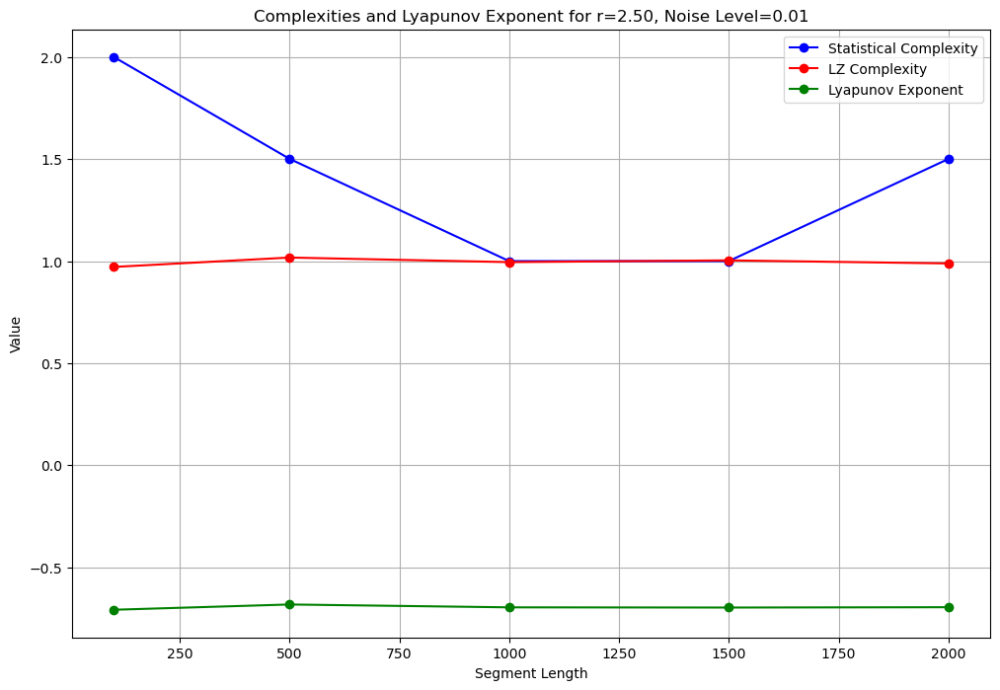

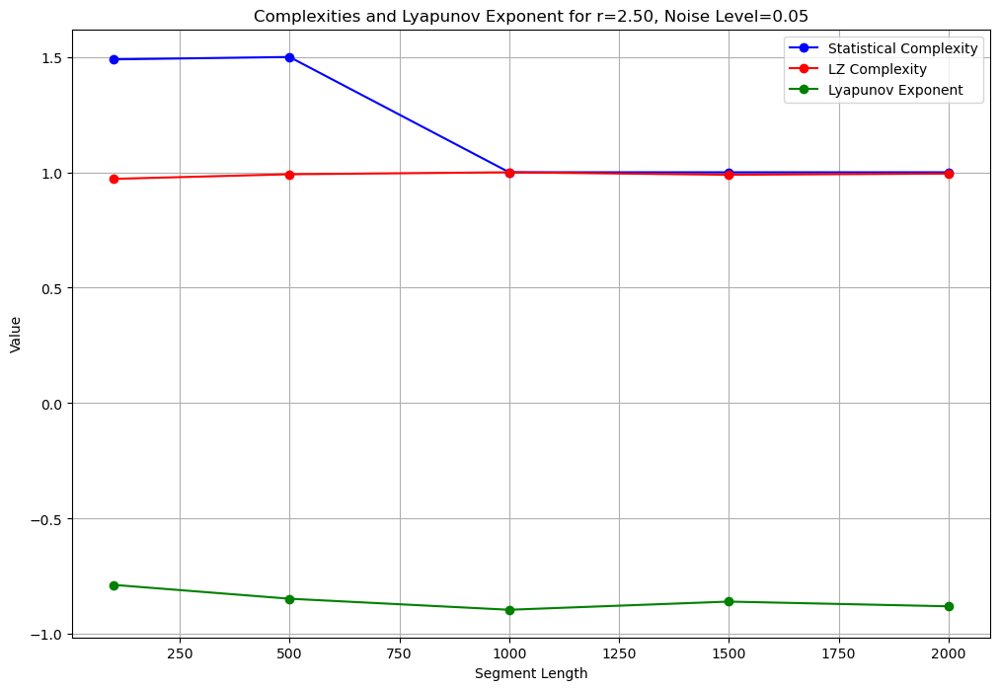

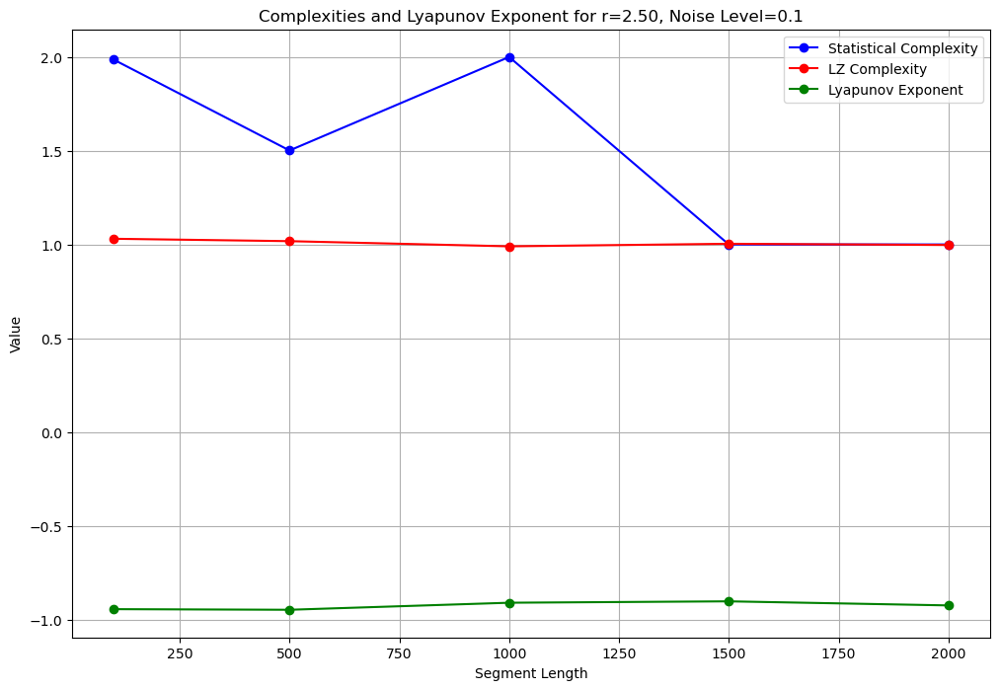

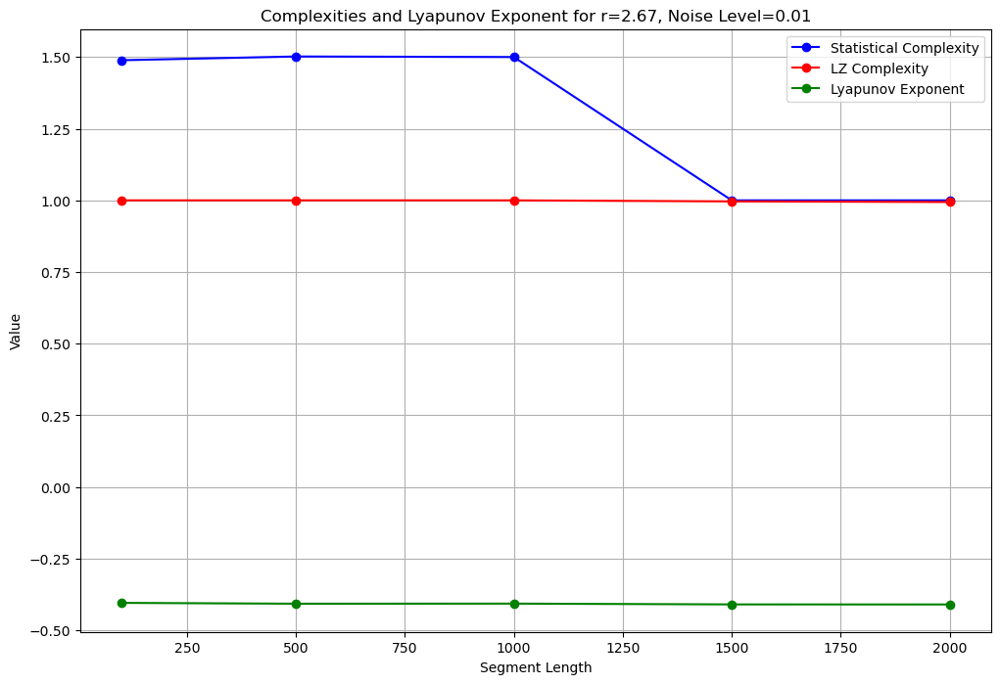

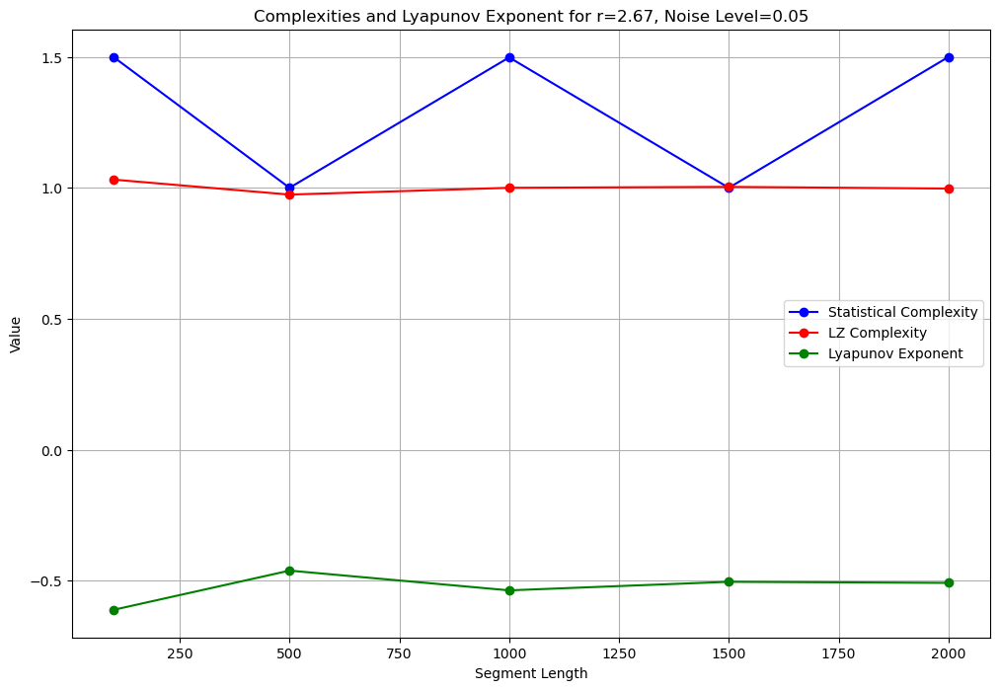

...

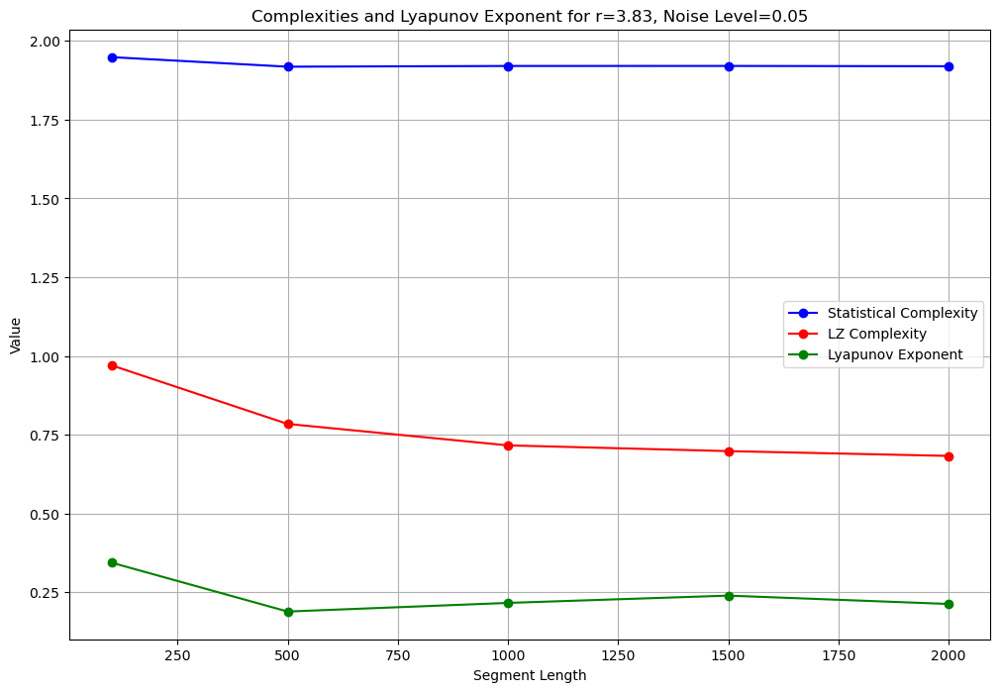

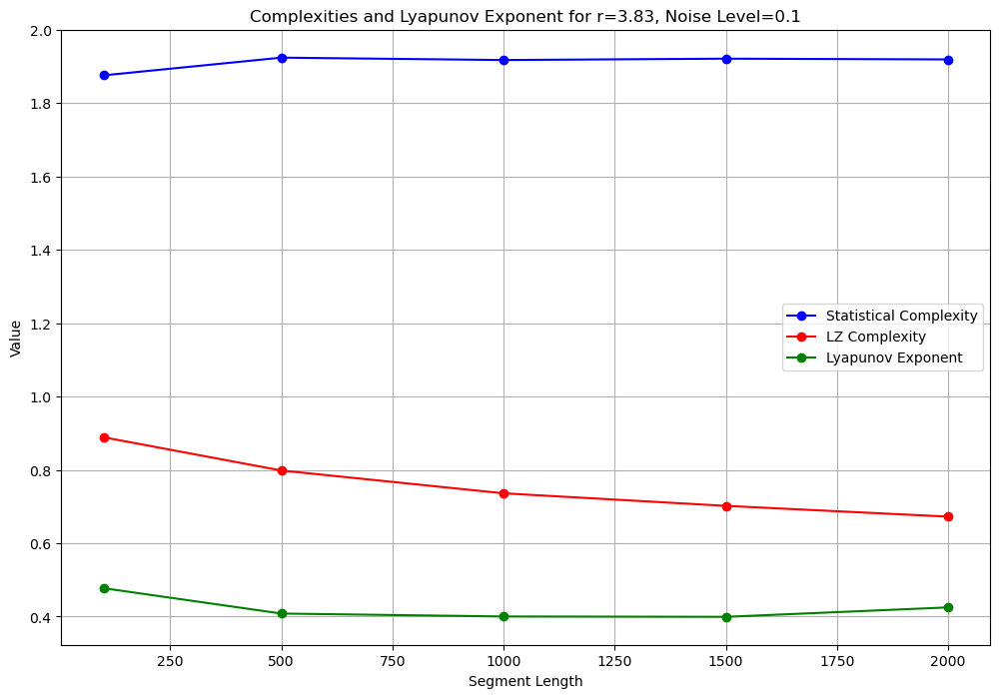

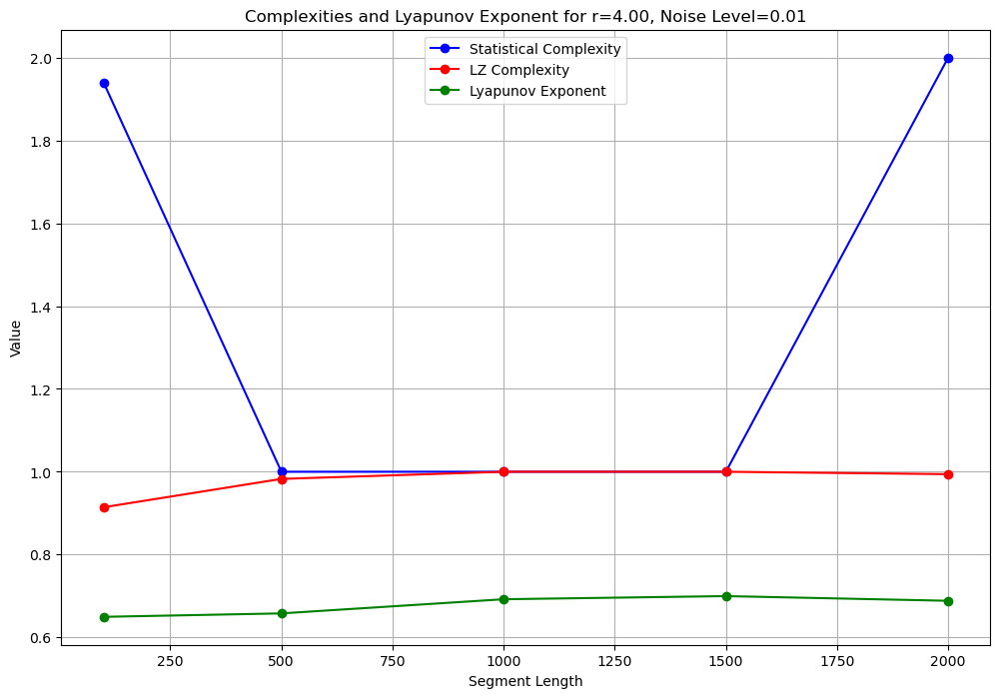

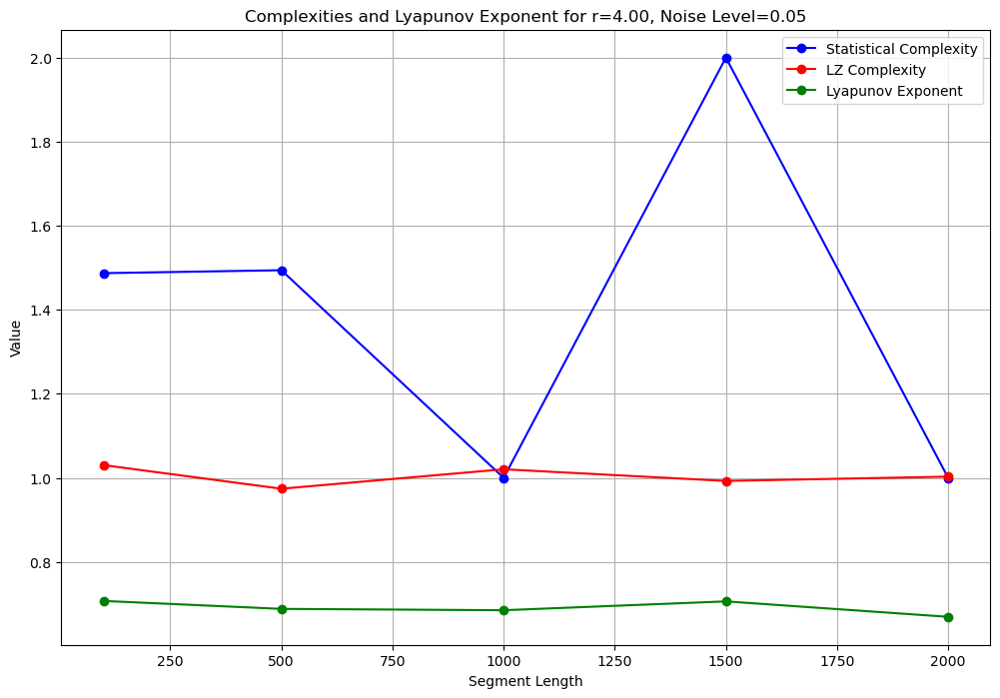

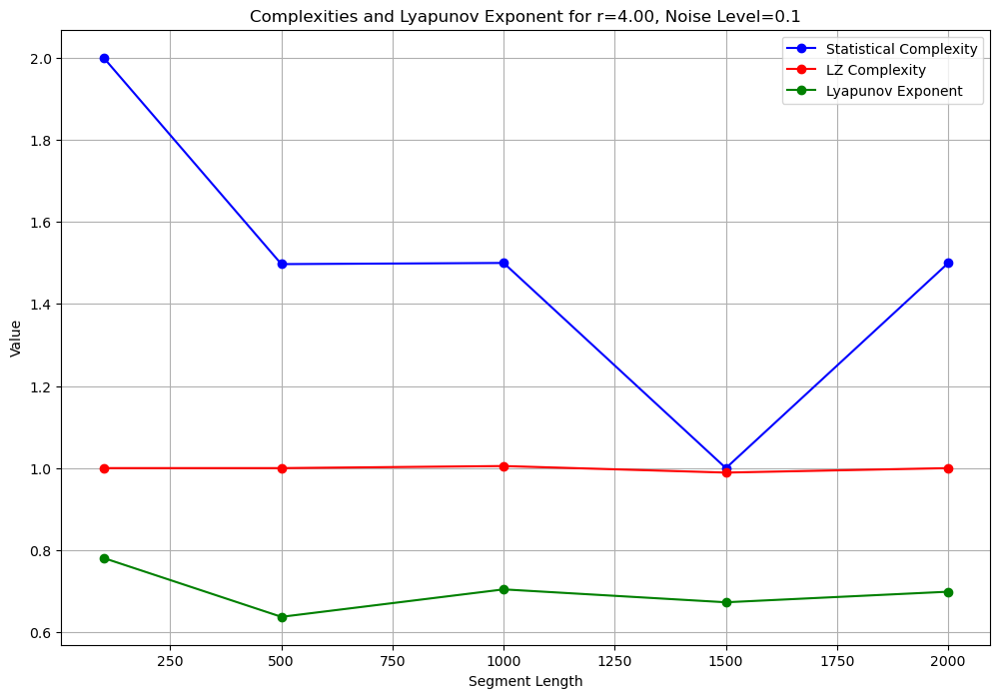

In [31]:
# Function to binarize data
def binarize_data(data, threshold):
    return (data > threshold).astype(int)

# Parameters
r_values = np.linspace(2.5, 4.0, 10)  # Range of r values in the chaotic regime
noise_levels = [0.01, 0.05, 0.1]      # Different levels of noise
segment_lengths = [100, 500, 1000, 1500, 2000]  # Different data segment lengths

# Simulation and plotting
for r in r_values:
    for noise_level in noise_levels:
        plt.figure(figsize=(12, 8))
        stat_complexities = []
        lz_complexities = []
        lyapunov_exponents = []
        for length in segment_lengths:
            x0 = np.random.rand()  # Random initial condition
            data = logistic_map(r, x0, length)
            noisy_data = add_white_noise(data, noise_level)
            binary_data = binarize_data(noisy_data, np.median(noisy_data))  # Median as threshold
            binary_string = ''.join(map(str, binary_data))

            # Calculate complexities
            stat_complexity = calculate_statistical_complexity(binary_string, dl=2, sigma=0.05)
            lz_complexity = calculate_lz_complexity(binary_string)
            lyapunov_exp = calculate_lyapunov_exponent(noisy_data, r)

            # Collect data for plotting
            stat_complexities.append(stat_complexity)
            lz_complexities.append(lz_complexity)
            lyapunov_exponents.append(lyapunov_exp)

        # Plot the complexities and Lyapunov exponent
        plt.plot(segment_lengths, stat_complexities, 'bo-', label='Statistical Complexity')
        plt.plot(segment_lengths, lz_complexities, 'ro-', label='LZ Complexity')
        plt.plot(segment_lengths, lyapunov_exponents, 'go-', label='Lyapunov Exponent')
        
        plt.title(f'Complexities and Lyapunov Exponent for r={r:.2f}, Noise Level={noise_level}')
        plt.xlabel('Segment Length')
        plt.ylabel('Value')
        plt.legend()
        plt.grid(True)
        plt.show()

### Further Analyses

1. **Comprehensive Parameter Sweeps**:
   - Expand the range and granularity of parameters (e.g., \\( r \\), noise levels, sequence lengths).
   - Perform Monte Carlo simulations to average results over multiple runs.

2. **Detailed Statistical Analysis**:
   - Conduct statistical tests (e.g., ANOVA, t-tests) to assess the significance of patterns.
   - Use confidence intervals to quantify uncertainties in complexities and Lyapunov exponents.

3. **Comparison with Other Complexity Measures**:
   - Introduce additional measures like Kolmogorov Complexity and Approximate Entropy.
   - Compare these measures' performance and behavior under identical conditions.

4. **Analysis of Bifurcation Patterns**:
   - Study the influence of the logistic map's bifurcation structure on complexity measures.
   - Plot bifurcation diagrams alongside complexity measures to visualize correlations.

5. **Visualizing Attractors**:
   - Generate phase-space plots to visualize logistic map attractors with and without noise.
   - Analyze the impact of noise on attractor structure and complexity measures.

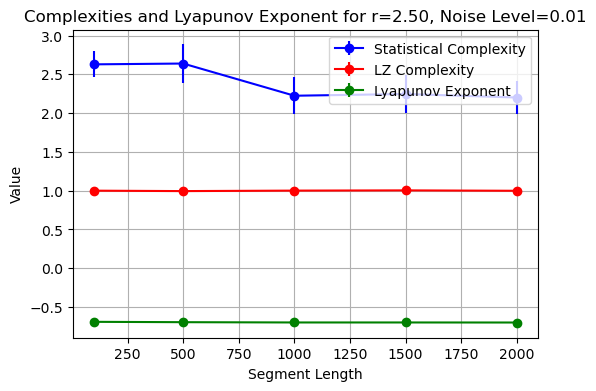

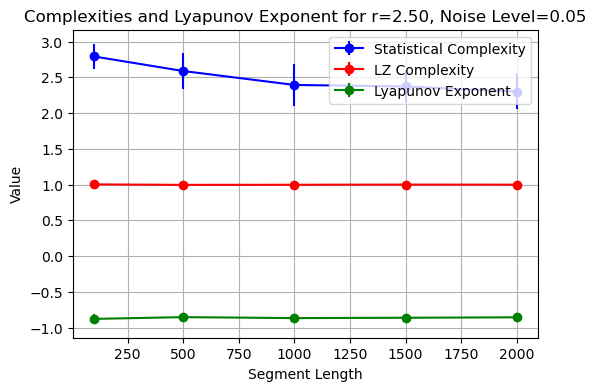

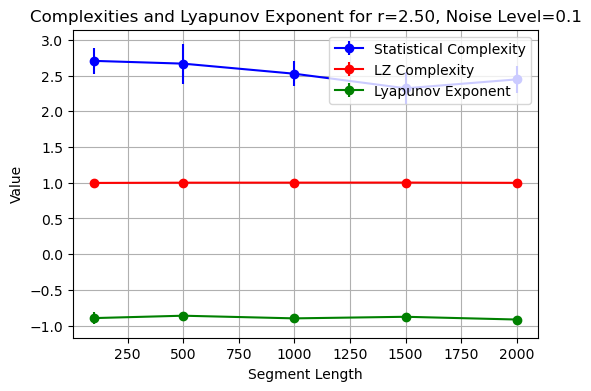

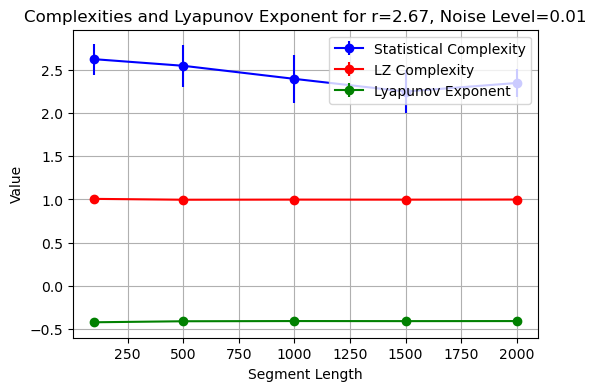

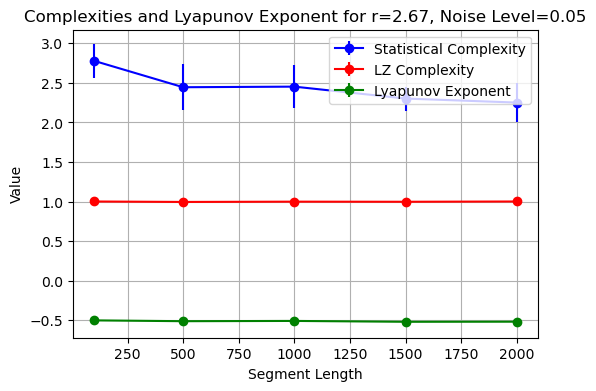

...

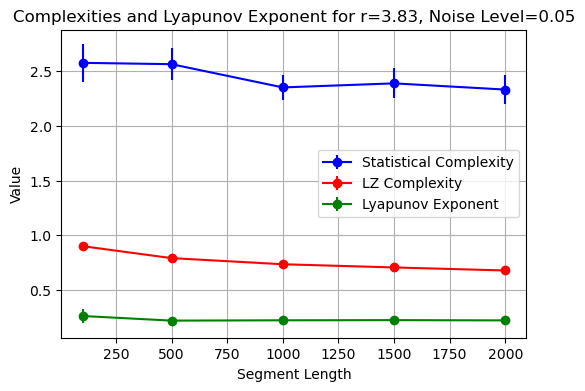

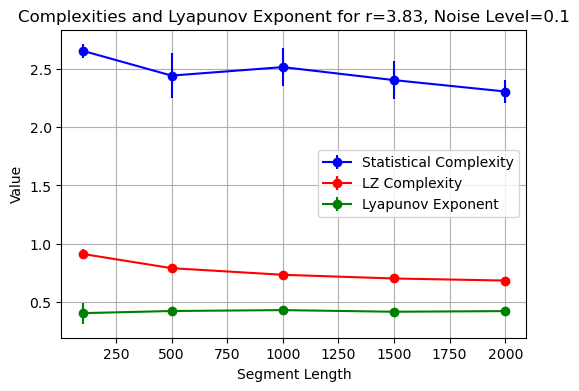

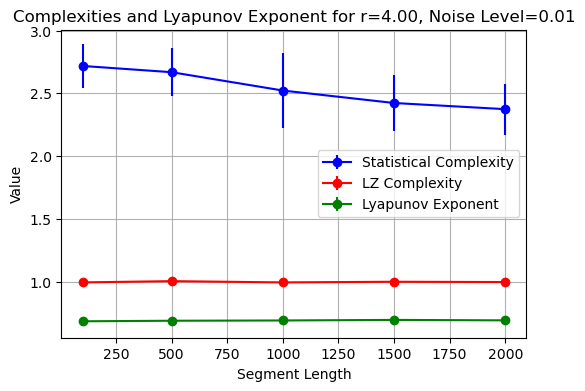

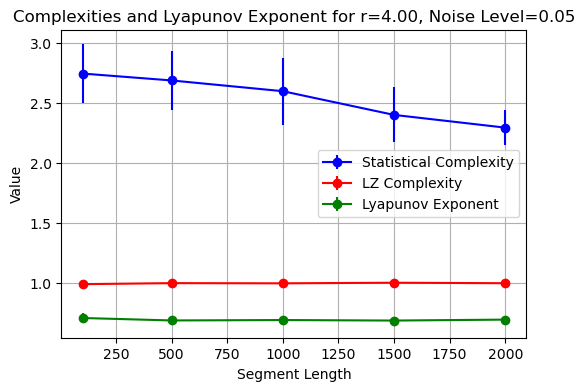

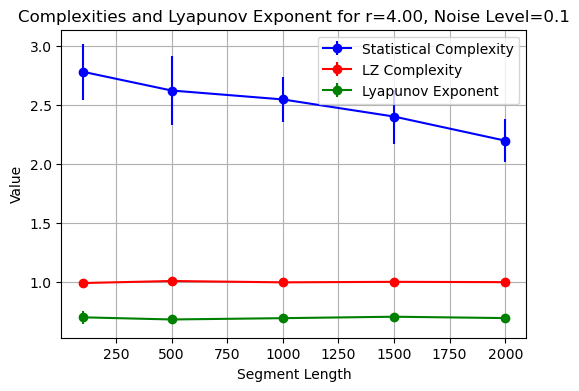

r=2.5, noise_level=0.01, length=100, SC=2.629±0.167, LZ=1.000±0.025, LE=-0.691±0.024
r=2.5, noise_level=0.01, length=500, SC=2.639±0.255, LZ=0.995±0.011, LE=-0.695±0.006
r=2.5, noise_level=0.01, length=1000, SC=2.224±0.235, LZ=1.001±0.009, LE=-0.699±0.003
r=2.5, noise_level=0.01, length=1500, SC=2.247±0.246, LZ=1.004±0.005, LE=-0.699±0.003
r=2.5, noise_level=0.01, length=2000, SC=2.201±0.218, LZ=0.999±0.005, LE=-0.699±0.003
r=2.5, noise_level=0.05, length=100, SC=2.791±0.178, LZ=1.003±0.033, LE=-0.877±0.068
r=2.5, noise_level=0.05, length=500, SC=2.588±0.255, LZ=0.997±0.012, LE=-0.852±0.040
r=2.5, noise_level=0.05, length=1000, SC=2.393±0.297, LZ=0.998±0.005, LE=-0.866±0.024
r=2.5, noise_level=0.05, length=1500, SC=2.372±0.230, LZ=1.000±0.007, LE=-0.861±0.020
r=2.5, noise_level=0.05, length=2000, SC=2.300±0.246, LZ=0.999±0.004, LE=-0.855±0.020
r=2.5, noise_level=0.1, length=100, SC=2.706±0.179, LZ=0.998±0.033, LE=-0.895±0.079
r=2.5, noise_level=0.1, length=500, SC=2.668±0.279, LZ=1.001

In [33]:
# Parameters
r_values = np.linspace(2.5, 4.0, 10)
noise_levels = [0.01, 0.05, 0.1]
segment_lengths = [100, 500, 1000, 1500, 2000]
num_runs = 10  # Monte Carlo runs

# Binarization function
def binarize_data(data, threshold):
    return (data > threshold).astype(int)

# Store results for statistical analysis
results = []

for r in r_values:
    for noise_level in noise_levels:
        stat_complexities_runs = []
        lz_complexities_runs = []
        lyapunov_exponents_runs = []
        
        for _ in range(num_runs):
            stat_complexities = []
            lz_complexities = []
            lyapunov_exponents = []
            for length in segment_lengths:
                x0 = np.random.rand()
                data = logistic_map(r, x0, length)
                noisy_data = add_white_noise(data, noise_level)
                binary_data = binarize_data(noisy_data, np.median(noisy_data))
                binary_string = ''.join(map(str, binary_data))

                # Calculate complexities
                stat_complexity = calculate_statistical_complexity(binary_string, dl=3, sigma=0.05)
                lz_complexity = calculate_lz_complexity(binary_string)
                lyapunov_exp = calculate_lyapunov_exponent(noisy_data, r)

                # Collect data for plotting
                stat_complexities.append(stat_complexity)
                lz_complexities.append(lz_complexity)
                lyapunov_exponents.append(lyapunov_exp)
            
            # Store results for statistical analysis
            stat_complexities_runs.append(stat_complexities)
            lz_complexities_runs.append(lz_complexities)
            lyapunov_exponents_runs.append(lyapunov_exponents)

        results.append({
            'r': r,
            'noise_level': noise_level,
            'stat_complexities': np.mean(stat_complexities_runs, axis=0),
            'lz_complexities': np.mean(lz_complexities_runs, axis=0),
            'lyapunov_exponents': np.mean(lyapunov_exponents_runs, axis=0),
            'stat_complexities_std': np.std(stat_complexities_runs, axis=0),
            'lz_complexities_std': np.std(lz_complexities_runs, axis=0),
            'lyapunov_exponents_std': np.std(lyapunov_exponents_runs, axis=0)
        })

# Visualization
for result in results:
    r = result['r']
    noise_level = result['noise_level']
    stat_complexities = result['stat_complexities']
    lz_complexities = result['lz_complexities']
    lyapunov_exponents = result['lyapunov_exponents']
    stat_complexities_std = result['stat_complexities_std']
    lz_complexities_std = result['lz_complexities_std']
    lyapunov_exponents_std = result['lyapunov_exponents_std']
    
    plt.figure(figsize=(6, 4))
    plt.errorbar(segment_lengths, stat_complexities, yerr=stat_complexities_std, fmt='bo-', label='Statistical Complexity')
    plt.errorbar(segment_lengths, lz_complexities, yerr=lz_complexities_std, fmt='ro-', label='LZ Complexity')
    plt.errorbar(segment_lengths, lyapunov_exponents, yerr=lyapunov_exponents_std, fmt='go-', label='Lyapunov Exponent')
    
    plt.title(f'Complexities and Lyapunov Exponent for r={r:.2f}, Noise Level={noise_level}')
    plt.xlabel('Segment Length')
    plt.ylabel('Value')
    plt.legend()
    plt.grid(True)
    plt.show()

# Statistical analysis
for r in r_values:
    for noise_level in noise_levels:
        result = next(res for res in results if res['r'] == r and res['noise_level'] == noise_level)
        for length in segment_lengths:
            sc_mean = result['stat_complexities'][segment_lengths.index(length)]
            lz_mean = result['lz_complexities'][segment_lengths.index(length)]
            le_mean = result['lyapunov_exponents'][segment_lengths.index(length)]
            sc_std = result['stat_complexities_std'][segment_lengths.index(length)]
            lz_std = result['lz_complexities_std'][segment_lengths.index(length)]
            le_std = result['lyapunov_exponents_std'][segment_lengths.index(length)]
            print(f'r={r}, noise_level={noise_level}, length={length}, SC={sc_mean:.3f}±{sc_std:.3f}, LZ={lz_mean:.3f}±{lz_std:.3f}, LE={le_mean:.3f}±{le_std:.3f}')

# Conduct t-tests between complexities at different noise levels
t_stat, p_value = ttest_ind(results[0]['stat_complexities'], results[1]['stat_complexities'])
print(f'T-test between first two sets of statistical complexities: t={t_stat:.3f}, p={p_value:.3f}')

### Additional Statistical Analyses

To provide a more thorough and insightful analysis of the complexities and Lyapunov exponents for the studied models, additional t-tests and plot confidence intervals for SC, LZ, and LE 

T-test between noise levels 0.01 and 0.05 for r=2.5: t=-0.749, p=0.475
T-test between noise levels 0.01 and 0.05 for r=2.5: t=-0.749, p=0.475
T-test between noise levels 0.01 and 0.05 for r=2.5: t=-0.749, p=0.475
T-test between noise levels 0.01 and 0.05 for r=2.6666666666666665: t=-0.110, p=0.915
T-test between noise levels 0.01 and 0.05 for r=2.6666666666666665: t=-0.110, p=0.915
T-test between noise levels 0.01 and 0.05 for r=2.6666666666666665: t=-0.110, p=0.915
T-test between noise levels 0.01 and 0.05 for r=2.8333333333333335: t=-0.792, p=0.451
T-test between noise levels 0.01 and 0.05 for r=2.8333333333333335: t=-0.792, p=0.451
T-test between noise levels 0.01 and 0.05 for r=2.8333333333333335: t=-0.792, p=0.451
T-test between noise levels 0.01 and 0.05 for r=3.0: t=-1.094, p=0.306
T-test between noise levels 0.01 and 0.05 for r=3.0: t=-1.094, p=0.306
T-test between noise levels 0.01 and 0.05 for r=3.0: t=-1.094, p=0.306
T-test between noise levels 0.01 and 0.05 for r=3.16666666

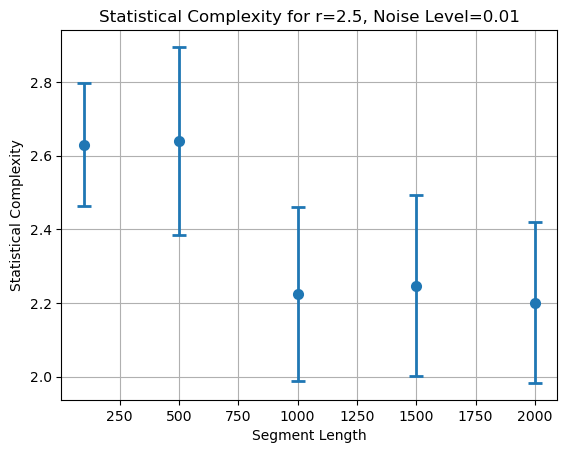

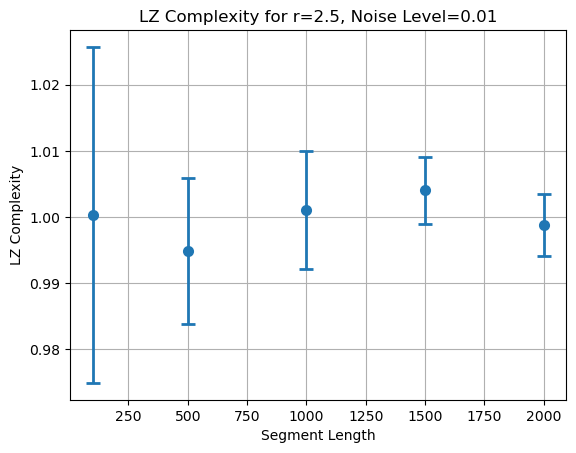

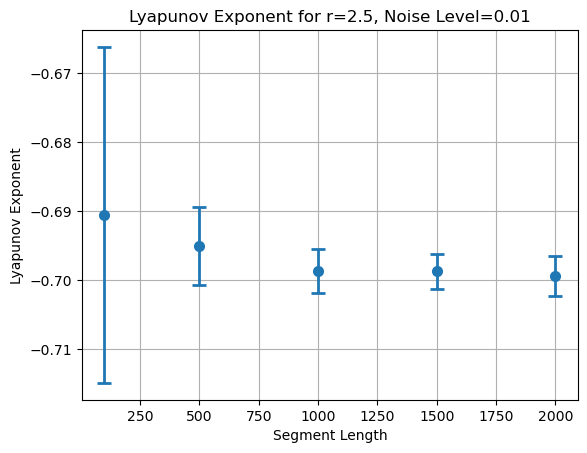

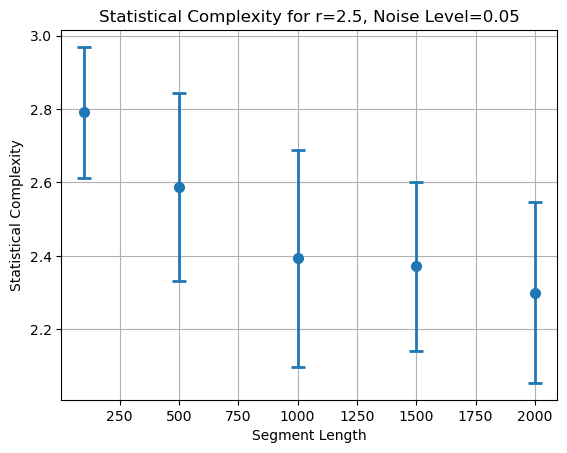

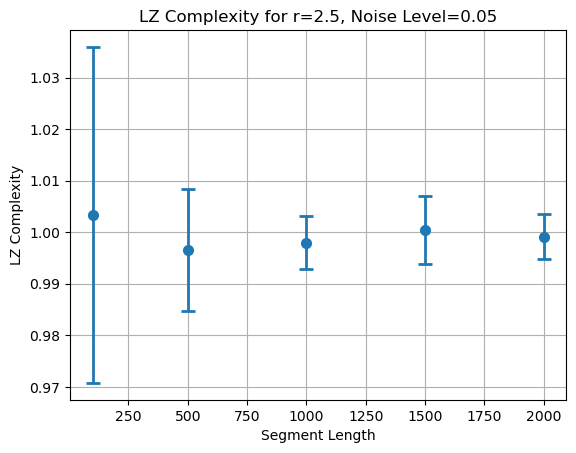

...

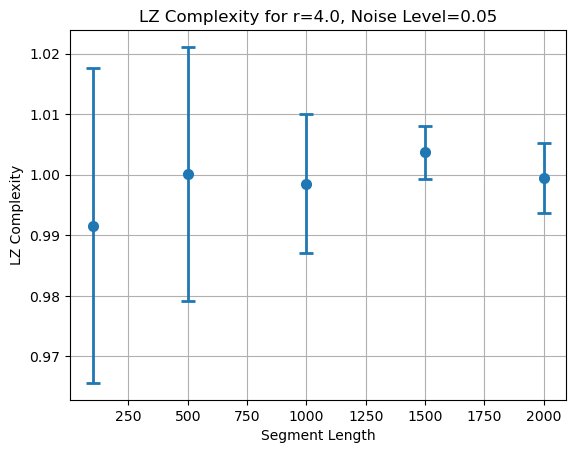

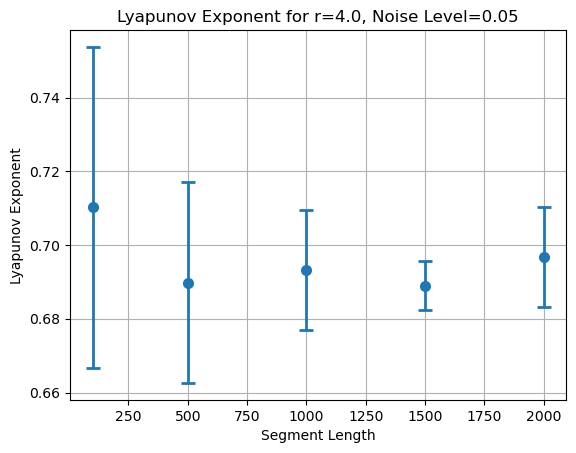

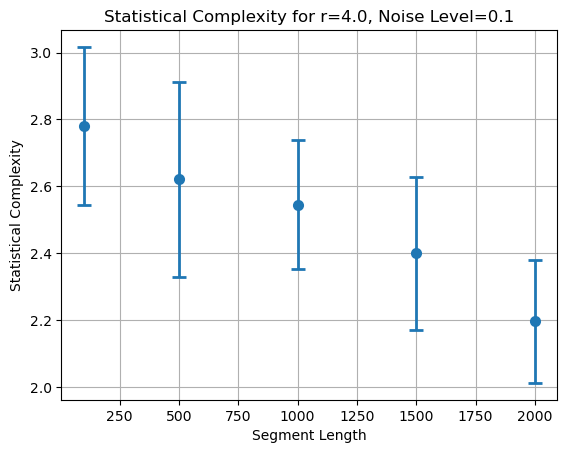

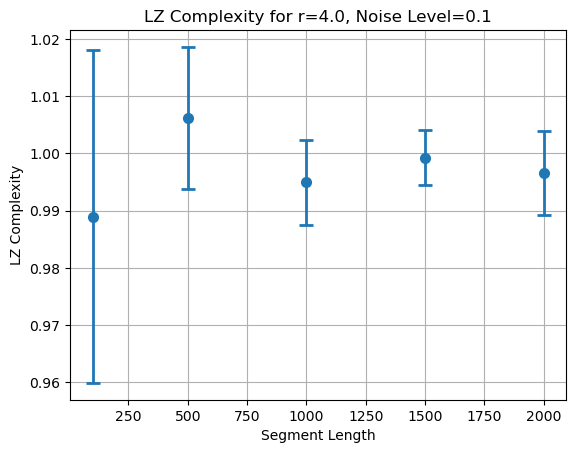

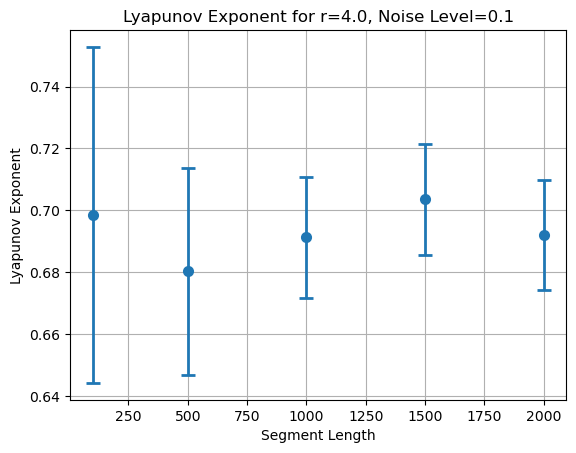

In [35]:
# Additional t-tests between different noise levels for a given r
for r in r_values:
    for noise_level in noise_levels:
        result_1 = next(res for res in results if res['r'] == r and res['noise_level'] == noise_levels[0])
        result_2 = next(res for res in results if res['r'] == r and res['noise_level'] == noise_levels[1])
        t_stat, p_value = stats.ttest_ind(result_1['stat_complexities'], result_2['stat_complexities'])
        print(f'T-test between noise levels {noise_levels[0]} and {noise_levels[1]} for r={r}: t={t_stat:.3f}, p={p_value:.3f}')

# Plotting confidence intervals
def plot_with_confidence_intervals(x, y, yerr, title, xlabel, ylabel):
    plt.errorbar(x, y, yerr=yerr, fmt='o', capsize=5, elinewidth=2, markeredgewidth=2)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.grid(True)
    plt.show()

for result in results:
    r = result['r']
    noise_level = result['noise_level']
    plot_with_confidence_intervals(segment_lengths, result['stat_complexities'], result['stat_complexities_std'], 
                                   f'Statistical Complexity for r={r}, Noise Level={noise_level}', 
                                   'Segment Length', 'Statistical Complexity')
    plot_with_confidence_intervals(segment_lengths, result['lz_complexities'], result['lz_complexities_std'], 
                                   f'LZ Complexity for r={r}, Noise Level={noise_level}', 
                                   'Segment Length', 'LZ Complexity')
    plot_with_confidence_intervals(segment_lengths, result['lyapunov_exponents'], result['lyapunov_exponents_std'], 
                                   f'Lyapunov Exponent for r={r}, Noise Level={noise_level}', 
                                   'Segment Length', 'Lyapunov Exponent')

## Behaviour on Multivariate Autoregressive (MVAR) Models

In [37]:
def statdata(A, npoints):
    """
    Generate time-series data for a Gaussian MVAR(p) process
    X_t = A_1 * X_{t-1} + A_2 * X_{t-2} + ... + A_p * X_{t-p} + E_t
    
    Args:
    - A (numpy.ndarray): Generalized connectivity matrix. Shape (nvar, nvar * p)
    - npoints (int): Number of data points to generate
    
    Returns:
    - X (numpy.ndarray): Time-series data. Shape (nvar, npoints)
    """
    settle = 500
    N = npoints + settle
    nvar = A.shape[0]
    p = A.shape[1] // nvar
    
    # Initialize time-series data with Gaussian noise
    X = np.random.normal(0, 1, (nvar, N))
    
    # Generate data based on MVAR model
    for i in range(p, N):
        for j in range(nvar):
            for k in range(nvar):
                for m in range(p):
                    X[j, i] += A[j, k + m * nvar] * X[k, i - m - 1]
    
    # Return only post-equilibrium data points
    return X[:, settle:]

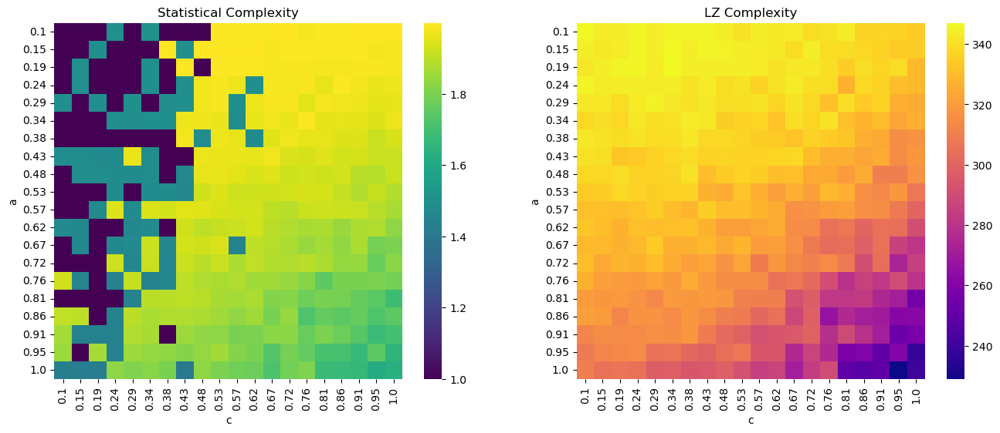

In [38]:
def statdata(A, npoints):
    settle = 500  # Number of initial points to discard for settling
    N = npoints + settle  # Total number of points including settling period
    nvar = A.shape[0]  # Number of variables
    p = A.shape[1] // nvar  # Order of the autoregressive model
    
    # Initialize the data matrix with random normal values
    X = np.random.normal(0, 1, (nvar, N))
    
    # Generate data using the autoregressive model
    for i in range(p, N):
        for j in range(nvar):
            for k in range(nvar):
                for m in range(p):
                    X[j, i] += A[j, k + m * nvar] * X[k, i - m - 1]
            # Apply normalization to avoid overflow
            X[j, i] = np.tanh(X[j, i])
    
    return X[:, settle:]  # Return data excluding the settling period

def cpr(string):
    d = {}
    w = ''
    for c in string:
        wc = w + c
        if wc in d:
            w = wc
        else:
            d[wc] = wc
            w = c
    return len(d)  # Return the length of the dictionary

def LZc_binary(sequence):
    binary_string = ''.join(map(str, sequence))  # Convert sequence to binary string
    return cpr(binary_string)  # Compute Lempel-Ziv complexity

def add_white_noise(data, noise_level):
    noise = np.random.normal(0, noise_level, size=data.shape)  # Generate white noise
    return data + noise  # Add noise to the data

def binarize_data(data, threshold):
    return (data > threshold).astype(int)  # Binarize data based on the threshold

def calculate_statistical_complexity(sequence, lambda_val, sigma_val):
    binary_string = ''.join(map(str, sequence))  # Convert sequence to binary string
    return calculate(binary_string, lambda_val, sigma=sigma_val)  # Calculate statistical complexity

# Parameters
nvar = 2  # Number of variables
p = 1  # Order of the autoregressive model
npoints = 1000  # Number of data points
noise_level = 0.05  # Noise level
a_values = np.linspace(0.1, 1.0, 20)  # Range of 'a' values
c_values = np.linspace(0.1, 1.0, 20)  # Range of 'c' values

# Initialize matrices to store results
stat_complexities = np.zeros((len(a_values), len(c_values)))
lz_complexities = np.zeros((len(a_values), len(c_values)))

# Loop through all combinations of 'a' and 'c' values
for i, a in enumerate(a_values):
    for j, c in enumerate(c_values):
        A = np.array([[a, c], [c, a]])  # Create the coefficient matrix
        data = statdata(A, npoints)  # Generate data
        data_noisy = add_white_noise(data, noise_level)  # Add white noise
        
        binary_data = binarize_data(data_noisy.flatten(), np.median(data_noisy))  # Binarize data
        
        stat_complexity = calculate_statistical_complexity(binary_data, lambda_val=2, sigma_val=0.05)  # Calculate statistical complexity
        lz_complexity = LZc_binary(binary_data)  # Calculate Lempel-Ziv complexity
        
        stat_complexities[i, j] = stat_complexity  # Store statistical complexity
        lz_complexities[i, j] = lz_complexity  # Store Lempel-Ziv complexity

# Plot heat maps
fig, axs = plt.subplots(1, 2, figsize=(16, 6))

# Plot statistical complexity heat map
sns.heatmap(stat_complexities, ax=axs[0], xticklabels=np.round(c_values, 2), yticklabels=np.round(a_values, 2), cmap='viridis')
axs[0].set_title('Statistical Complexity')
axs[0].set_xlabel('c')
axs[0].set_ylabel('a')

# Plot Lempel-Ziv complexity heat map
sns.heatmap(lz_complexities, ax=axs[1], xticklabels=np.round(c_values, 2), yticklabels=np.round(a_values, 2), cmap='plasma')
axs[1].set_title('LZ Complexity')
axs[1].set_xlabel('c')
axs[1].set_ylabel('a')

plt.show()

### Analysis of How Complexity Measures Change with Lyapunov Exponent In Logistic Map Dynamics

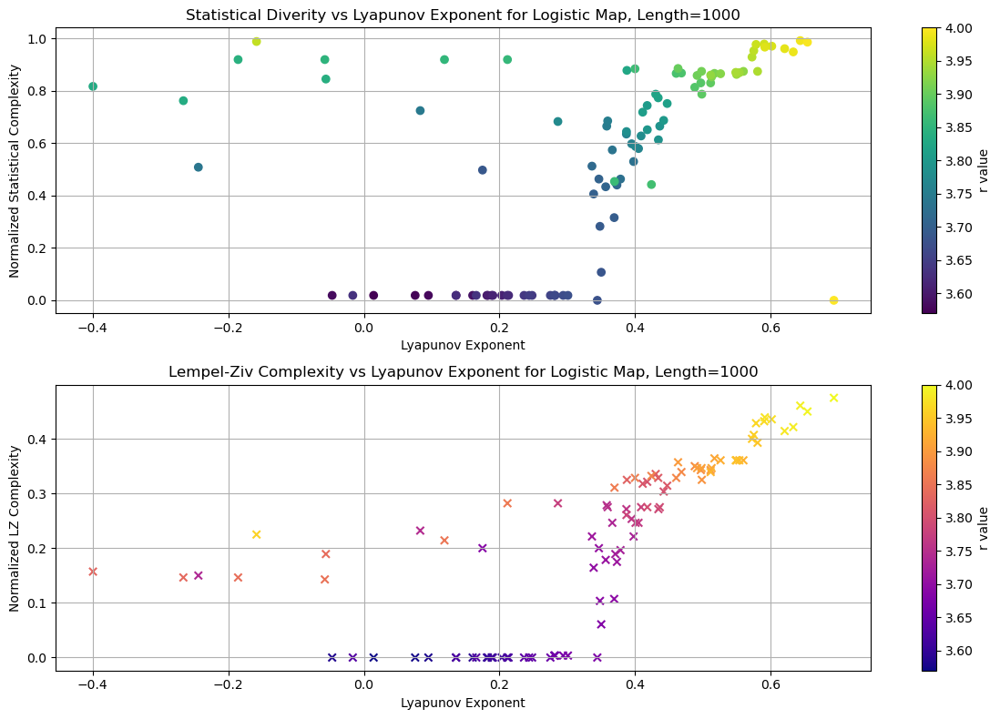

Length=1000:
Statistical Diverity vs Lyapunov Exponent: Correlation=0.3832, p-value=0.0001
LZ Complexity vs Lyapunov Exponent: Correlation=0.6859, p-value=0.0000


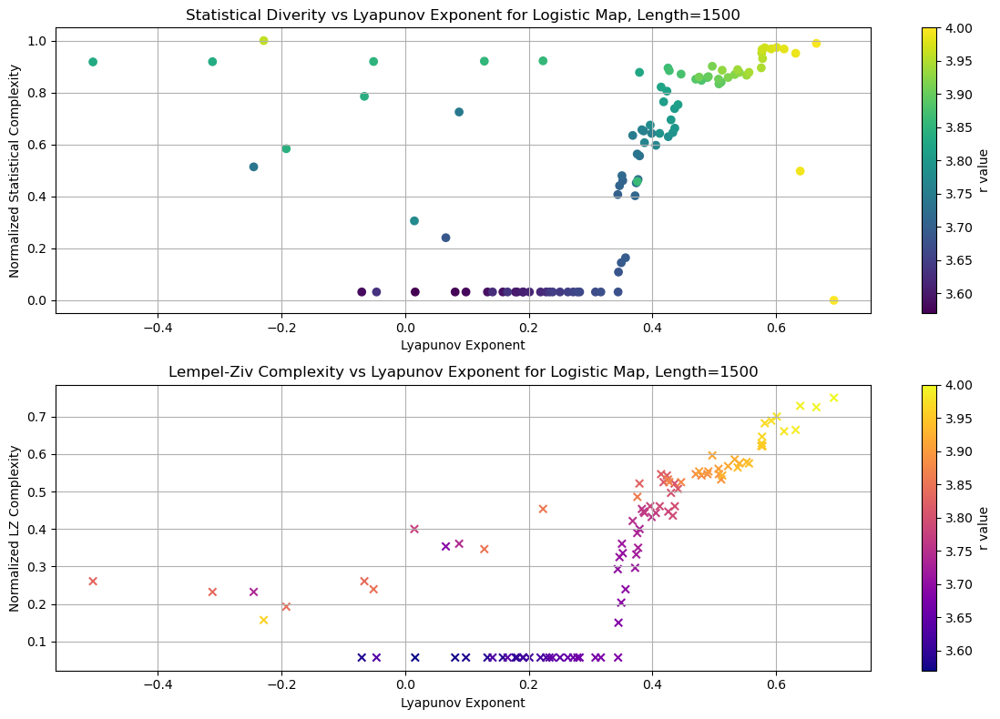

Length=1500:
Statistical Diverity vs Lyapunov Exponent: Correlation=0.3638, p-value=0.0002
LZ Complexity vs Lyapunov Exponent: Correlation=0.7076, p-value=0.0000


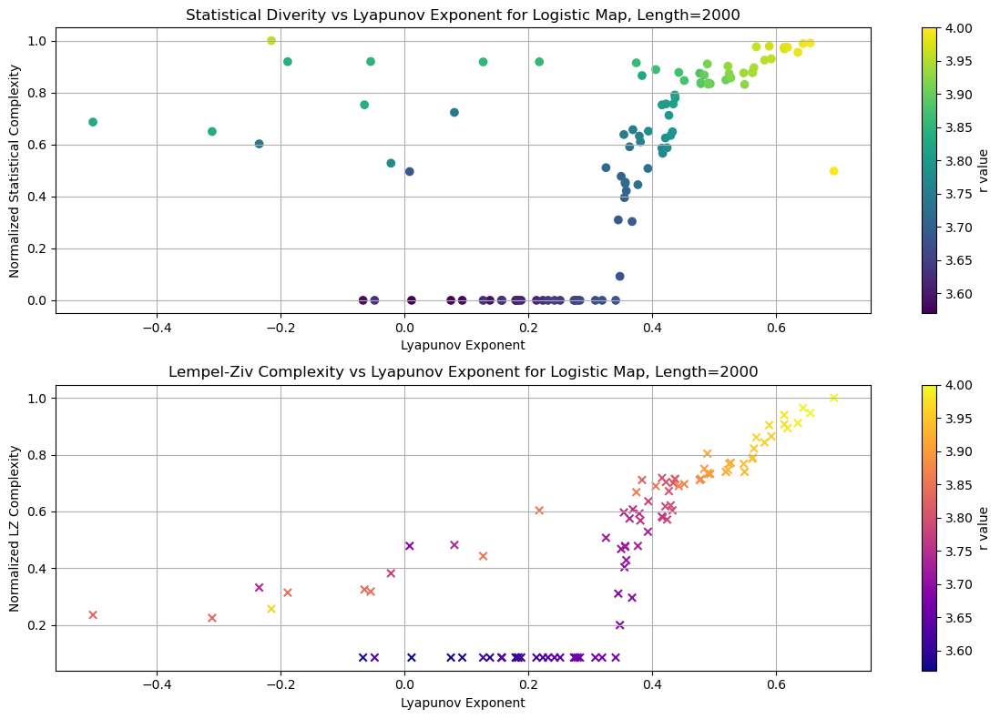

Length=2000:
Statistical Diverity vs Lyapunov Exponent: Correlation=0.4189, p-value=0.0000
LZ Complexity vs Lyapunov Exponent: Correlation=0.7320, p-value=0.0000


In [40]:
# Normalization function
def normalize(data):
    return (data - np.min(data)) / (np.max(data) - np.min(data))

# Parameters for logistic map
r_values = np.linspace(3.57, 4, 100) 
segment_lengths = [1000, 1500, 2000]
num_runs = 10  # Monte Carlo runs

# Store results for plotting
results = []

for length in segment_lengths:
    x0 = np.random.rand()
    for r in r_values:
        logistic_data = logistic_map(r, x0, length)
        if np.isnan(logistic_data).any():
            continue  # Skip this r value if overflow occurred
        
        binary_data = binarize_data(logistic_data, np.median(logistic_data))
        binary_string = ''.join(map(str, binary_data))

        # Calculate complexities
        stat_complexity = calculate_statistical_complexity(binary_string, lambda_val=2, sigma_val=0.05)
        lz_complexity = LZc_binary(binary_string)
        
        # Calculate Lyapunov exponent
        lyapunov_exp = calculate_lyapunov_exponent(logistic_data, r)
        
        results.append((r, length, stat_complexity, lz_complexity, lyapunov_exp))

# Convert results to a structured array
dtype = [('r', float), ('length', int), ('stat_complexity', float), ('lz_complexity', float), ('lyapunov_exponent', float)]
structured_results = np.array(results, dtype=dtype)

# Normalize complexities
normalized_stat_complexities = normalize(structured_results['stat_complexity'])
normalized_lz_complexities = normalize(structured_results['lz_complexity'])

# Plot results
for length in segment_lengths:
    r_vals = []
    stat_complexities = []
    lz_complexities = []
    lyapunov_exponents = []
    
    for result in structured_results:
        if result['length'] == length:
            r_vals.append(result['r'])
            stat_complexities.append(normalized_stat_complexities[np.where((structured_results['r'] == result['r']) & (structured_results['length'] == result['length']))[0][0]])
            lz_complexities.append(normalized_lz_complexities[np.where((structured_results['r'] == result['r']) & (structured_results['length'] == result['length']))[0][0]])
            lyapunov_exponents.append(result['lyapunov_exponent'])
    
    plt.figure(figsize=(12, 8))

    # Statistical Diverity vs Lyapunov Exponent
    plt.subplot(2, 1, 1)
    plt.scatter(lyapunov_exponents, stat_complexities, c=r_vals, cmap='viridis', label='Statistical Complexity')
    plt.colorbar(label='r value')
    plt.title(f'Statistical Diverity vs Lyapunov Exponent for Logistic Map, Length={length}')
    plt.xlabel('Lyapunov Exponent')
    plt.ylabel('Normalized Statistical Complexity')
    plt.grid(True)

    # Lempel-Ziv Complexity vs Lyapunov Exponent
    plt.subplot(2, 1, 2)
    plt.scatter(lyapunov_exponents, lz_complexities, c=r_vals, cmap='plasma', label='LZ Complexity', marker='x')
    plt.colorbar(label='r value')
    plt.title(f'Lempel-Ziv Complexity vs Lyapunov Exponent for Logistic Map, Length={length}')
    plt.xlabel('Lyapunov Exponent')
    plt.ylabel('Normalized LZ Complexity')
    plt.grid(True)

    plt.tight_layout()
    plt.show()

    # Correlation Analysis
    corr_stat, p_val_stat = pearsonr(lyapunov_exponents, stat_complexities)
    corr_lz, p_val_lz = pearsonr(lyapunov_exponents, lz_complexities)
    print(f'Length={length}:')
    print(f'Statistical Diverity vs Lyapunov Exponent: Correlation={corr_stat:.4f}, p-value={p_val_stat:.4f}')
    print(f'LZ Complexity vs Lyapunov Exponent: Correlation={corr_lz:.4f}, p-value={p_val_lz:.4f}')

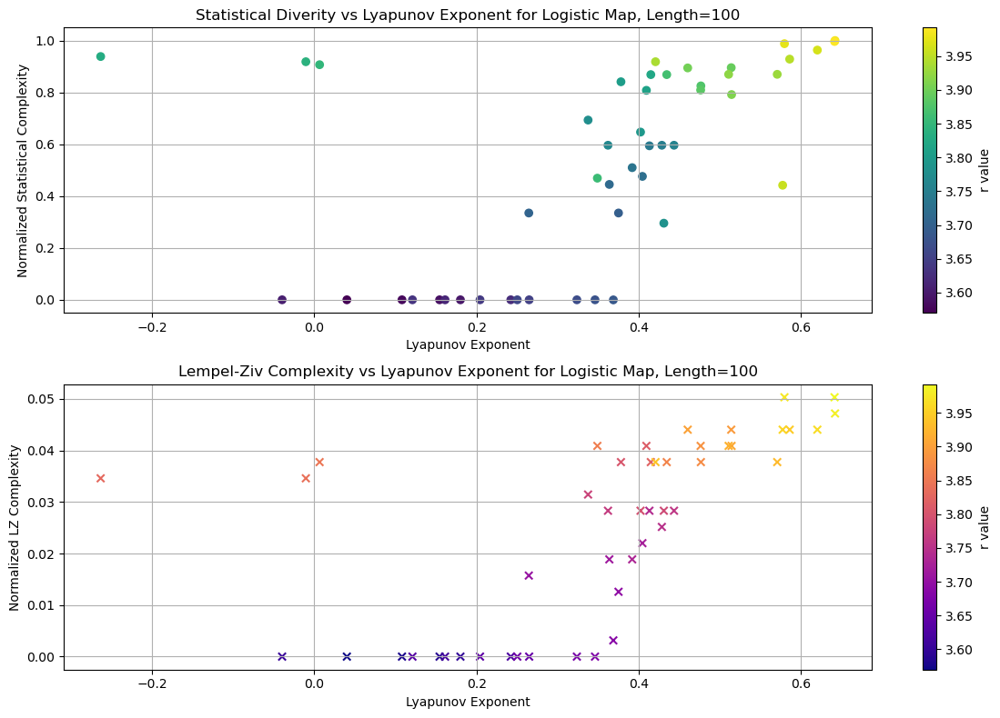

Length=100:
Statistical Diverity vs Lyapunov Exponent: Correlation=0.4744, p-value=0.0007
LZ Complexity vs Lyapunov Exponent: Correlation=0.5856, p-value=0.0000


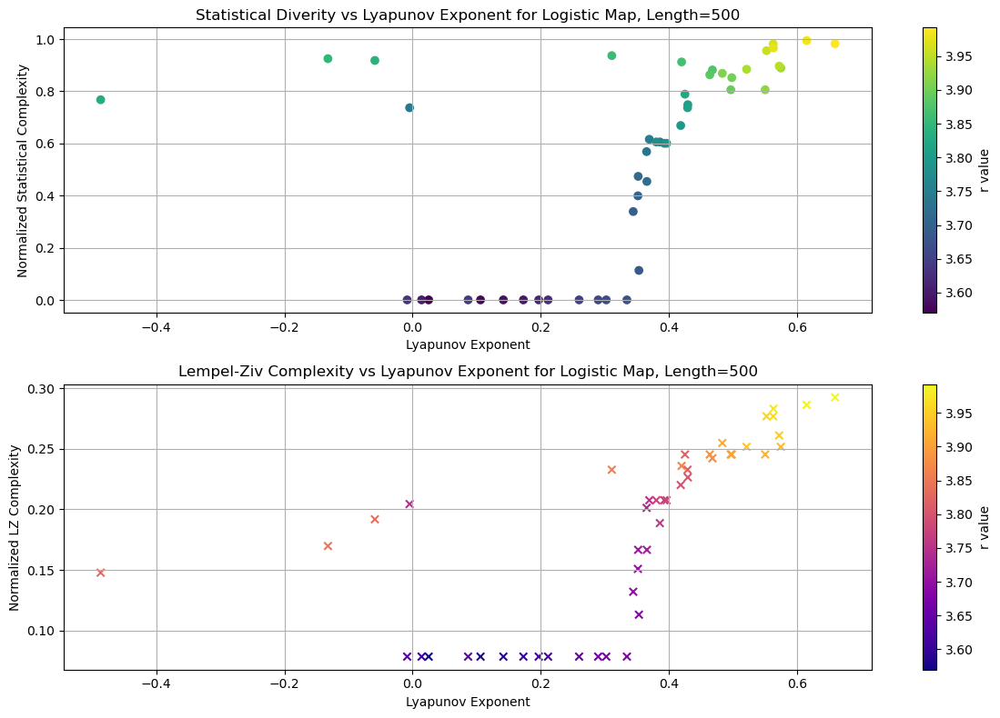

Length=500:
Statistical Diverity vs Lyapunov Exponent: Correlation=0.4450, p-value=0.0015
LZ Complexity vs Lyapunov Exponent: Correlation=0.6545, p-value=0.0000


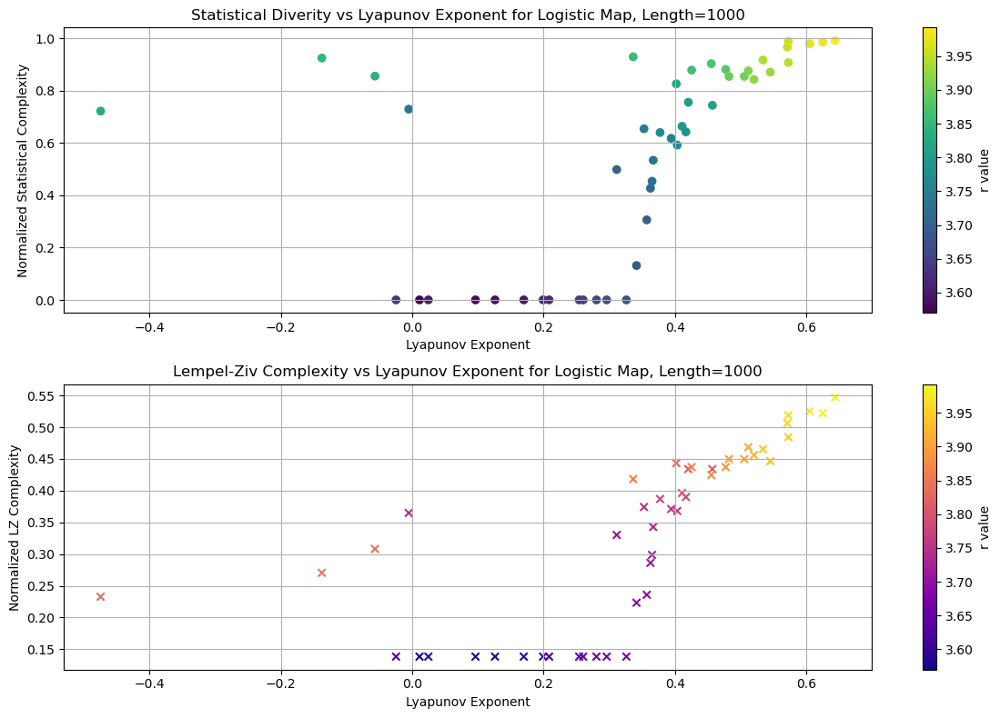

Length=1000:
Statistical Diverity vs Lyapunov Exponent: Correlation=0.4668, p-value=0.0008
LZ Complexity vs Lyapunov Exponent: Correlation=0.6971, p-value=0.0000


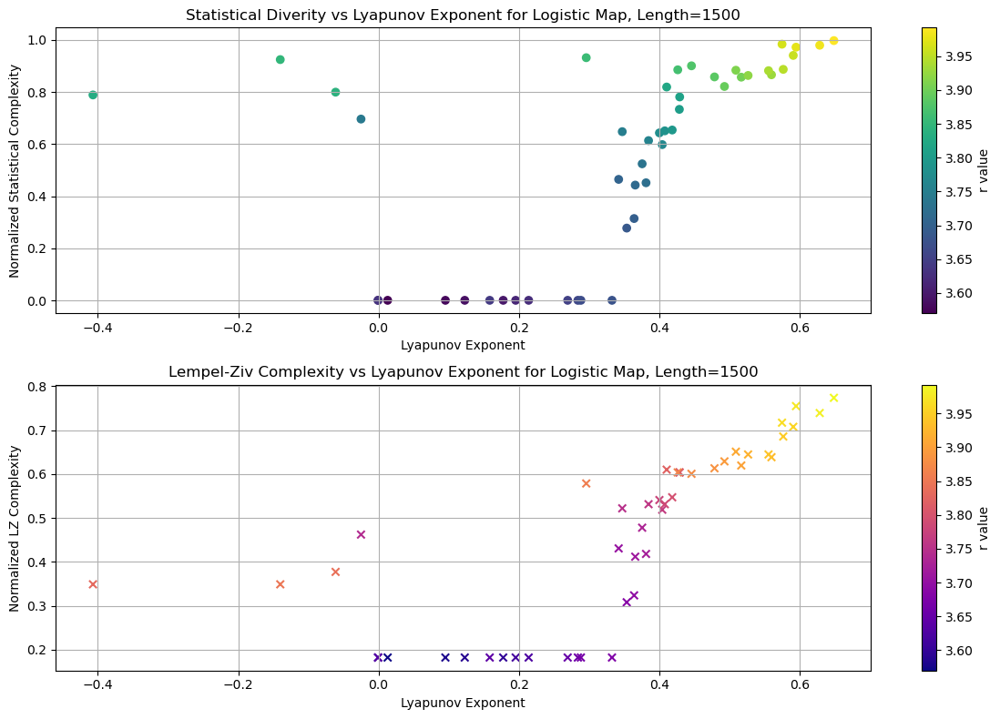

Length=1500:
Statistical Diverity vs Lyapunov Exponent: Correlation=0.4797, p-value=0.0006
LZ Complexity vs Lyapunov Exponent: Correlation=0.7232, p-value=0.0000


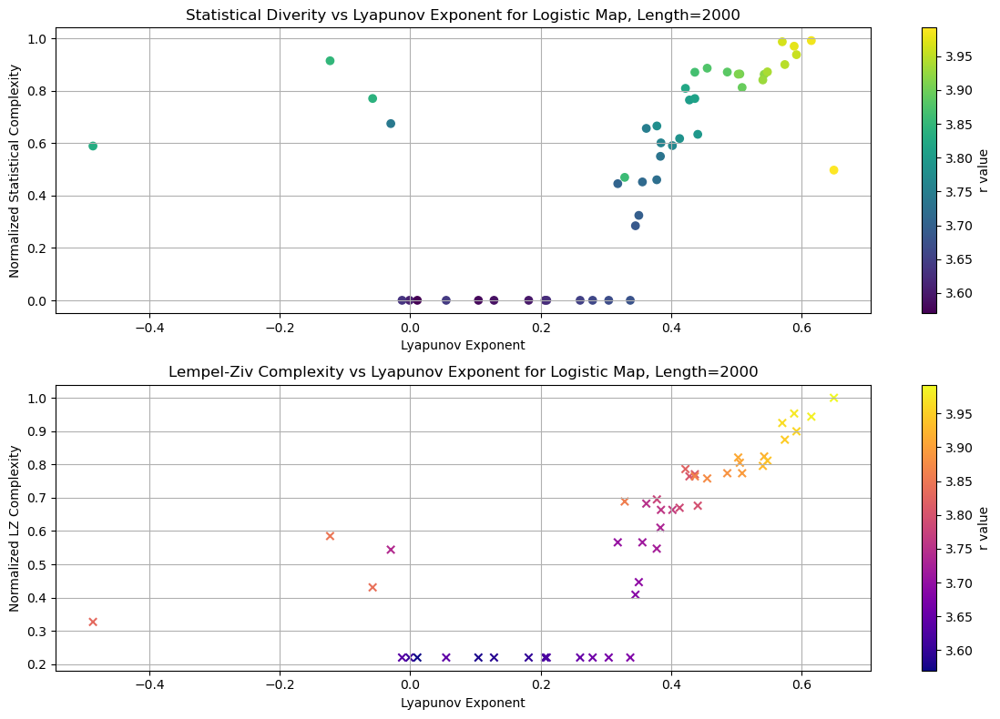

Length=2000:
Statistical Diverity vs Lyapunov Exponent: Correlation=0.5015, p-value=0.0003
LZ Complexity vs Lyapunov Exponent: Correlation=0.7384, p-value=0.0000


In [41]:
# Function to calculate Lyapunov exponent for logistic map
def calculate_lyapunov_exponent(data, r, epsilon=1e-10):
    n = len(data)
    log_argument = np.abs(r * (1 - 2 * data)) + epsilon
    lyapunov_exp = np.sum(np.log(log_argument)) / n
    return lyapunov_exp

# Function to generate data using logistic map with overflow handling
def logistic_map(r, x0, n):
    x = np.zeros(n)
    x[0] = x0
    for i in range(1, n):
        x[i] = r * x[i-1] * (1 - x[i-1])
        if x[i] < 0 or x[i] > 1:
            x[i] = np.nan  # Handle overflow by setting to NaN
    return x

# Function to calculate complexities
def calculate_statistical_complexity(sequence, lambda_val, sigma_val):
    binary_string = ''.join(sequence)
    return calculate(binary_string, lambda_val, sigma=sigma_val)

def LZc_binary(sequence):
    """
    Compute Lempel-Ziv complexity for a binary string.
    """
    return cpr(sequence)

# Function to binarize data
def binarize_data(data, threshold):
    return (data > threshold).astype(int)

# Normalization function
def normalize(data):
    return (data - np.min(data)) / (np.max(data) - np.min(data))

# Parameters for logistic map
r_values = np.linspace(3.57, 4.1, 60)  # Including values slightly greater than 4
segment_lengths = [100, 500, 1000, 1500, 2000]
num_runs = 10  # Monte Carlo runs

# Store results for plotting
results = []

for length in segment_lengths:
    x0 = np.random.rand()
    for r in r_values:
        logistic_data = logistic_map(r, x0, length)
        if np.isnan(logistic_data).any():
            continue  # Skip this r value if overflow occurred
        
        binary_data = binarize_data(logistic_data, np.median(logistic_data))
        binary_string = ''.join(map(str, binary_data))

        # Calculate complexities
        stat_complexity = calculate_statistical_complexity(binary_string, lambda_val=2, sigma_val=0.05)
        lz_complexity = LZc_binary(binary_string)
        
        # Calculate Lyapunov exponent
        lyapunov_exp = calculate_lyapunov_exponent(logistic_data, r)
        
        results.append((r, length, stat_complexity, lz_complexity, lyapunov_exp))

# Convert results to a structured array
dtype = [('r', float), ('length', int), ('stat_complexity', float), ('lz_complexity', float), ('lyapunov_exponent', float)]
structured_results = np.array(results, dtype=dtype)

# Normalize complexities
normalized_stat_complexities = normalize(structured_results['stat_complexity'])
normalized_lz_complexities = normalize(structured_results['lz_complexity'])

# Plot results
for length in segment_lengths:
    r_vals = []
    stat_complexities = []
    lz_complexities = []
    lyapunov_exponents = []
    
    for result in structured_results:
        if result['length'] == length:
            r_vals.append(result['r'])
            stat_complexities.append(normalized_stat_complexities[np.where((structured_results['r'] == result['r']) & (structured_results['length'] == result['length']))[0][0]])
            lz_complexities.append(normalized_lz_complexities[np.where((structured_results['r'] == result['r']) & (structured_results['length'] == result['length']))[0][0]])
            lyapunov_exponents.append(result['lyapunov_exponent'])
    
    plt.figure(figsize=(12, 8))

    # Statistical Diverity vs Lyapunov Exponent
    plt.subplot(2, 1, 1)
    plt.scatter(lyapunov_exponents, stat_complexities, c=r_vals, cmap='viridis', label='Statistical Complexity')
    plt.colorbar(label='r value')
    plt.title(f'Statistical Diverity vs Lyapunov Exponent for Logistic Map, Length={length}')
    plt.xlabel('Lyapunov Exponent')
    plt.ylabel('Normalized Statistical Complexity')
    plt.grid(True)

    # Lempel-Ziv Complexity vs Lyapunov Exponent
    plt.subplot(2, 1, 2)
    plt.scatter(lyapunov_exponents, lz_complexities, c=r_vals, cmap='plasma', label='LZ Complexity', marker='x')
    plt.colorbar(label='r value')
    plt.title(f'Lempel-Ziv Complexity vs Lyapunov Exponent for Logistic Map, Length={length}')
    plt.xlabel('Lyapunov Exponent')
    plt.ylabel('Normalized LZ Complexity')
    plt.grid(True)

    plt.tight_layout()
    plt.show()

    # Correlation Analysis
    corr_stat, p_val_stat = pearsonr(lyapunov_exponents, stat_complexities)
    corr_lz, p_val_lz = pearsonr(lyapunov_exponents, lz_complexities)
    print(f'Length={length}:')
    print(f'Statistical Diverity vs Lyapunov Exponent: Correlation={corr_stat:.4f}, p-value={p_val_stat:.4f}')
    print(f'LZ Complexity vs Lyapunov Exponent: Correlation={corr_lz:.4f}, p-value={p_val_lz:.4f}')

### Statistical Complexity, LZ Complexity, and Lyapunov Exponent Against the r-values

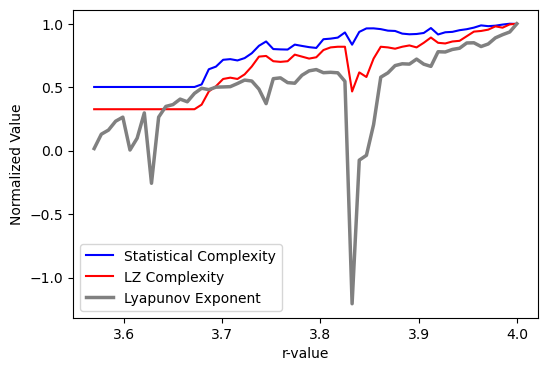

In [43]:
# Function to calculate Lyapunov exponent for logistic map
def calculate_lyapunov_exponent(data, r, epsilon=1e-10):
    n = len(data)
    log_argument = np.abs(r * (1 - 2 * data)) + epsilon
    lyapunov_exp = np.sum(np.log(log_argument)) / n
    return lyapunov_exp

# Function to generate data using logistic map with overflow handling
def logistic_map(r, x0, n):
    x = np.zeros(n)
    x[0] = x0
    for i in range(1, n):
        x[i] = r * x[i-1] * (1 - x[i-1])
        if x[i] < 0 or x[i] > 1:
            x[i] = np.nan  # Handle overflow by setting to NaN
    return x

# Function to calculate complexities
def calculate_statistical_complexity(sequence, lambda_val, sigma_val):
    binary_string = ''.join(sequence)
    return calculate(binary_string, lambda_val, sigma=sigma_val)

def LZc_binary(sequence):
    """
    Compute Lempel-Ziv complexity for a binary string.
    """
    return cpr(sequence)

# Function to binarize data
def binarize_data(data, threshold):
    return (data > threshold).astype(int)

# Parameters for logistic map
r_values = np.linspace(3.57, 4, 60)  
segment_length = 1000
x0 = np.random.rand()

# Store results for plotting
stat_complexities = []
lz_complexities = []
lyapunov_exponents = []

for r in r_values:
    logistic_data = logistic_map(r, x0, segment_length)
    if np.isnan(logistic_data).any():
        stat_complexities.append(np.nan)
        lz_complexities.append(np.nan)
        lyapunov_exponents.append(np.nan)
        continue  # Skip this r value if overflow occurred
    
    binary_data = binarize_data(logistic_data, np.median(logistic_data))
    binary_string = ''.join(map(str, binary_data))

    # Calculate complexities
    stat_complexity = calculate_statistical_complexity(binary_string, lambda_val=2, sigma_val=0.05)
    lz_complexity = LZc_binary(binary_string)
    
    # Calculate Lyapunov exponent
    lyapunov_exp = calculate_lyapunov_exponent(logistic_data, r)
    
    stat_complexities.append(stat_complexity)
    lz_complexities.append(lz_complexity)
    lyapunov_exponents.append(lyapunov_exp)

# Normalize complexities for better visualization
max_lz = np.nanmax(lz_complexities)
max_stat = np.nanmax(stat_complexities)
max_lyap = np.nanmax(lyapunov_exponents)

lz_complexities = [lz / max_lz if not np.isnan(lz) else np.nan for lz in lz_complexities]
stat_complexities = [stat / max_stat if not np.isnan(stat) else np.nan for stat in stat_complexities]
lyapunov_exponents = [lyap / max_lyap if not np.isnan(lyap) else np.nan for lyap in lyapunov_exponents]


# Plot results
plt.figure(figsize=(6, 4))

plt.plot(r_values, stat_complexities, 'b-', label='Statistical Complexity')
plt.plot(r_values, lz_complexities, 'r-', label='LZ Complexity')
#plt.plot(r_values, lyapunov_exponents, 'g-', label='Lyapunov Exponent')
plt.plot(r_values, lyapunov_exponents, color='grey', linewidth=2.5, label='Lyapunov Exponent')  # Grey color, thicker line


#plt.title('Complexities and Lyapunov Exponent vs r-values for Logistic Map')
plt.xlabel('r-value')
plt.ylabel('Normalized Value')
plt.legend()
#plt.grid(True)

plt.show()

## Comparison with Other Complexity Measures on Logistic Map Data

### 1. Kolmogorov Complexity \\(K(x)\\)

In [46]:
# Function to compute Kolmogorov Complexity
def calculate_kolmogorov_complexity(sequence):
    binary_string = ''.join(sequence)
    compressed = zlib.compress(binary_string.encode('utf-8'))
    return len(compressed)

### 2. Approximate Entropy (ApEn)

In [48]:
# Function to compute Approximate Entropy manually
def approximate_entropy(U, m, r):
    def _maxdist(x_i, x_j):
        return max([abs(ua - va) for ua, va in zip(x_i, x_j)])
    
    N = len(U)
    x = [U[i: i + m] for i in range(N - m + 1)]
    C = [(sum([_maxdist(x_i, x_j) <= r for x_j in x]) - 1) / (N - m) for x_i in x]
    return np.log(np.sum(C) / (N - m + 1))

#### Comparison of Measures on Logistic map

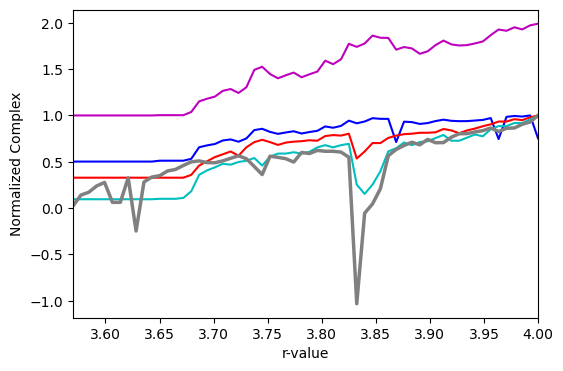

In [50]:
# Function to compute Kolmogorov Complexity
def calculate_kolmogorov_complexity(sequence):
    binary_string = ''.join(sequence)
    compressed = zlib.compress(binary_string.encode('utf-8'))
    return len(compressed)

# Function to compute Approximate Entropy manually
def approximate_entropy(U, m, r):
    def _maxdist(x_i, x_j):
        return max([abs(ua - va) for ua, va in zip(x_i, x_j)])
    
    N = len(U)
    x = [U[i: i + m] for i in range(N - m + 1)]
    C = [(sum([_maxdist(x_i, x_j) <= r for x_j in x]) - 1) / (N - m) for x_i in x]
    return np.log(np.sum(C) / (N - m + 1))

# Function to binarize data
def binarize_data(data, threshold):
    return (data > threshold).astype(int)

# Parameters for logistic map
r_values = np.linspace(3.57, 4.0, 60) 
segment_length = 1000
x0 = np.random.rand()

# Store results for plotting
stat_complexities = []
lz_complexities = []
kolmogorov_complexities = []
approx_entropy_values = []
lyapunov_exponents = []

for r in r_values:
    logistic_data = logistic_map(r, x0, segment_length)
    if np.isnan(logistic_data).any():
        stat_complexities.append(np.nan)
        lz_complexities.append(np.nan)
        kolmogorov_complexities.append(np.nan)
        approx_entropy_values.append(np.nan)
        lyapunov_exponents.append(np.nan)
        continue  # Skip this r value if overflow occurred
    
    binary_data = binarize_data(logistic_data, np.median(logistic_data))
    binary_string = ''.join(map(str, binary_data))

    # Calculate complexities
    stat_complexity = calculate_statistical_complexity(binary_string, lambda_val=2, sigma_val=0.05)
    lz_complexity = LZc_binary(binary_string)
    kolmogorov_complexity = calculate_kolmogorov_complexity(binary_string)
    approx_entropy_value = approximate_entropy(np.array(list(map(int, binary_string))), m=2, r=0.2)
    
    # Calculate Lyapunov exponent
    lyapunov_exp = calculate_lyapunov_exponent(logistic_data, r)
    
    stat_complexities.append(stat_complexity)
    lz_complexities.append(lz_complexity)
    kolmogorov_complexities.append(kolmogorov_complexity)
    approx_entropy_values.append(approx_entropy_value)
    lyapunov_exponents.append(lyapunov_exp)

# Normalize complexities for better visualization
max_lz = np.nanmax(lz_complexities)
max_stat = np.nanmax(stat_complexities)
max_kolmogorov = np.nanmax(kolmogorov_complexities)
max_approx_entropy = np.nanmax(approx_entropy_values)
max_lyap = np.nanmax(lyapunov_exponents)

lz_complexities = [lz / max_lz if not np.isnan(lz) else np.nan for lz in lz_complexities]
stat_complexities = [stat / max_stat if not np.isnan(stat) else np.nan for stat in stat_complexities]
kolmogorov_complexities = [kol / max_kolmogorov if not np.isnan(kol) else np.nan for kol in kolmogorov_complexities]
approx_entropy_values = [approx / max_approx_entropy if not np.isnan(approx) else np.nan for approx in approx_entropy_values]
lyapunov_exponents = [lyap / max_lyap if not np.isnan(lyap) else np.nan for lyap in lyapunov_exponents]

# Plot results as smooth lines without dots
plt.figure(figsize=(6, 4))

plt.plot(r_values, stat_complexities, 'b-', label='Statistical Complexity')  # 'b-' for blue line
plt.plot(r_values, lz_complexities, 'r-', label='LZ Complexity')             # 'r-' for red line
plt.plot(r_values, kolmogorov_complexities, 'c-', label='Kolmogorov Complexity')  # 'c-' for cyan line
plt.plot(r_values, approx_entropy_values, 'm-', label='Approximate Entropy') # 'm-' for magenta line
plt.plot(r_values, lyapunov_exponents, color='grey', linewidth=2.5, label='Lyapunov Exponent')  # Grey color, thicker line

#plt.title('Complexities and Lyapunov Exponent vs r-values for Logistic Map')
plt.xlabel('r-value')
plt.ylabel('Normalized Complex')
#plt.legend()
#plt.grid(True)
plt.xlim(3.57, 4.0)

file_path = r'C:\Users\odans\Documents\SUSSEX LAB WORKS\DISSERTATION\Images\New folder\Lyu1.png'
plt.savefig(file_path, dpi=300, bbox_inches='tight')

plt.show()

### Analysis of Bifurcation Patterns in the Logistic Map
This analyzes how the bifurcation structure of the logistic map influences the complexity measures

In [52]:
# Function to Generate Bifurcation
def logistic_map_bifurcation(r_min, r_max, r_step, num_iter, last_iter):
    r_values = np.arange(r_min, r_max, r_step)
    x = 1e-5 * np.ones(len(r_values))

    bifurcation_x = []
    bifurcation_r = []

    for i in range(num_iter):
        x = r_values * x * (1 - x)
        if i >= (num_iter - last_iter):
            bifurcation_x.extend(x)
            bifurcation_r.extend(r_values)

    return bifurcation_r, bifurcation_x

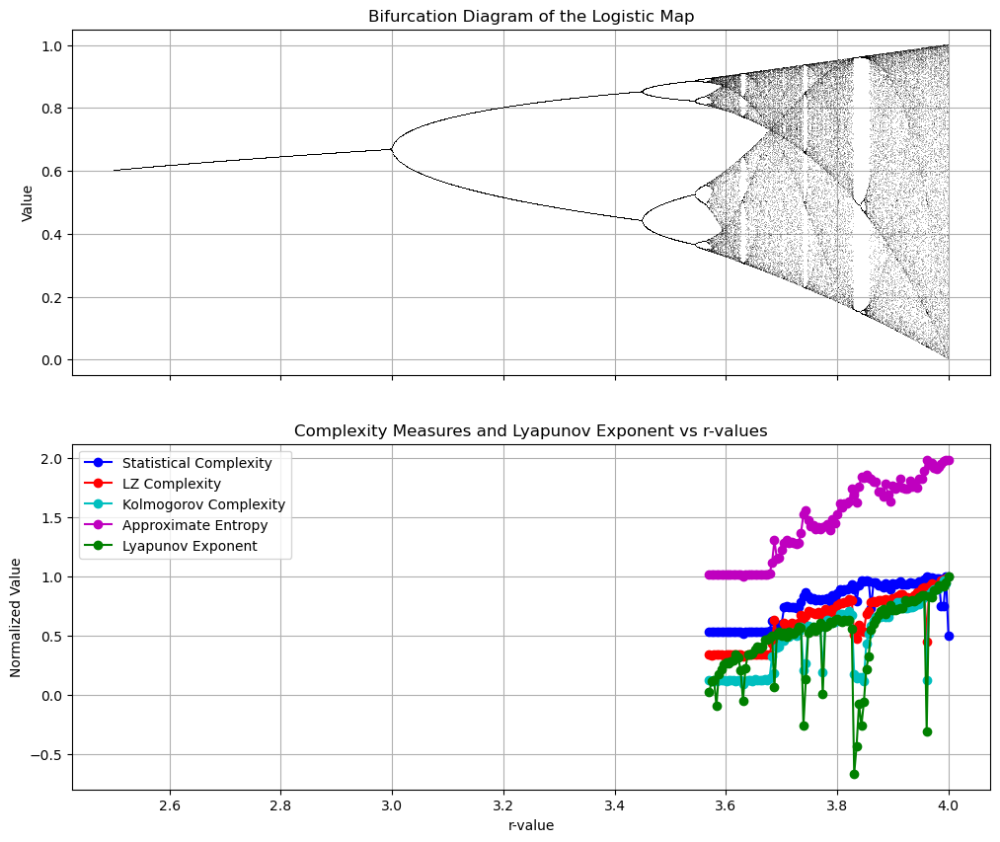

In [53]:
# Bifurcation parameters
r_min = 2.5
r_max = 4.0
r_step = 0.001
num_iter = 1000
last_iter = 100

bifurcation_r, bifurcation_x = logistic_map_bifurcation(r_min, r_max, r_step, num_iter, last_iter)

# Parameters for logistic map
r_values = np.linspace(3.57, 4.0, 100)  # Including values slightly greater than 4
segment_length = 1000
x0 = np.random.rand()

# Store results for plotting
stat_complexities = []
lz_complexities = []
kolmogorov_complexities = []
approx_entropy_values = []
lyapunov_exponents = []

for r in r_values:
    logistic_data = logistic_map(r, x0, segment_length)
    if np.isnan(logistic_data).any():
        stat_complexities.append(np.nan)
        lz_complexities.append(np.nan)
        kolmogorov_complexities.append(np.nan)
        approx_entropy_values.append(np.nan)
        lyapunov_exponents.append(np.nan)
        continue  # Skip this r value if overflow occurred
    
    binary_data = binarize_data(logistic_data, np.median(logistic_data))
    binary_string = ''.join(map(str, binary_data))

    # Calculate complexities
    stat_complexity = calculate_statistical_complexity(binary_string, lambda_val=2, sigma_val=0.05)
    lz_complexity = LZc_binary(binary_string)
    kolmogorov_complexity = calculate_kolmogorov_complexity(binary_string)
    approx_entropy_value = approximate_entropy(np.array(list(map(int, binary_string))), m=2, r=0.2)
    
    # Calculate Lyapunov exponent
    lyapunov_exp = calculate_lyapunov_exponent(logistic_data, r)
    
    stat_complexities.append(stat_complexity)
    lz_complexities.append(lz_complexity)
    kolmogorov_complexities.append(kolmogorov_complexity)
    approx_entropy_values.append(approx_entropy_value)
    lyapunov_exponents.append(lyapunov_exp)

# Normalize complexities for better visualization
max_lz = np.nanmax(lz_complexities)
max_stat = np.nanmax(stat_complexities)
max_kolmogorov = np.nanmax(kolmogorov_complexities)
max_approx_entropy = np.nanmax(approx_entropy_values)
max_lyap = np.nanmax(lyapunov_exponents)

lz_complexities = [lz / max_lz if not np.isnan(lz) else np.nan for lz in lz_complexities]
stat_complexities = [stat / max_stat if not np.isnan(stat) else np.nan for stat in stat_complexities]
kolmogorov_complexities = [kol / max_kolmogorov if not np.isnan(kol) else np.nan for kol in kolmogorov_complexities]
approx_entropy_values = [approx / max_approx_entropy if not np.isnan(approx) else np.nan for approx in approx_entropy_values]
lyapunov_exponents = [lyap / max_lyap if not np.isnan(lyap) else np.nan for lyap in lyapunov_exponents]

# Plot bifurcation diagram and complexity measures
fig, axs = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

# Bifurcation diagram
axs[0].plot(bifurcation_r, bifurcation_x, ',k', alpha=0.25)
axs[0].set_title('Bifurcation Diagram of the Logistic Map')
axs[0].set_ylabel('Value')
axs[0].grid(True)

# Complexity measures
axs[1].plot(r_values, stat_complexities, 'bo-', label='Statistical Complexity')
axs[1].plot(r_values, lz_complexities, 'ro-', label='LZ Complexity')
axs[1].plot(r_values, kolmogorov_complexities, 'co-', label='Kolmogorov Complexity')
axs[1].plot(r_values, approx_entropy_values, 'mo-', label='Approximate Entropy')
axs[1].plot(r_values, lyapunov_exponents, 'go-', label='Lyapunov Exponent')
axs[1].set_title('Complexity Measures and Lyapunov Exponent vs r-values')
axs[1].set_xlabel('r-value')
axs[1].set_ylabel('Normalized Value')
axs[1].legend()
axs[1].grid(True)

plt.show()

### Visualising Attractors of the Logistic Map

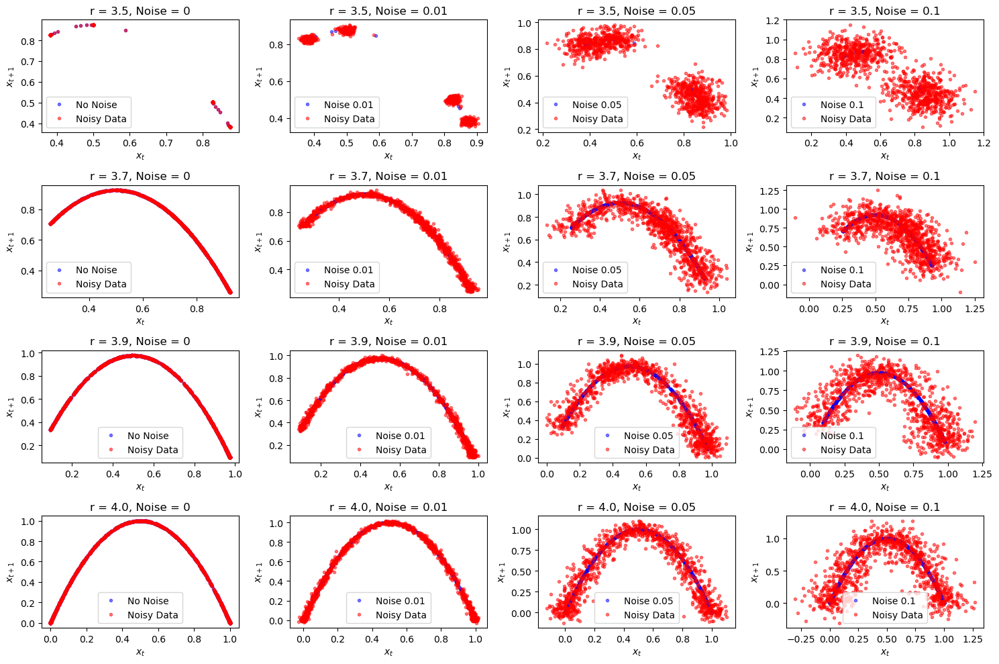

In [55]:
# Generate phase-space plots for different r values
r_values = [3.5, 3.7, 3.9, 4.0]
segment_length = 1000
x0 = np.random.rand()
noise_levels = [0, 0.01, 0.05, 0.1]

plt.figure(figsize=(15, 10))

for i, r in enumerate(r_values):
    for j, noise_level in enumerate(noise_levels):
        logistic_data = logistic_map(r, x0, segment_length)
        noisy_data = add_white_noise(logistic_data, noise_level)
        
        plt.subplot(len(r_values), len(noise_levels), i*len(noise_levels) + j + 1)
        plt.plot(logistic_data[:-1], logistic_data[1:], 'b.', alpha=0.5, label='No Noise' if noise_level == 0 else f'Noise {noise_level}')
        plt.plot(noisy_data[:-1], noisy_data[1:], 'r.', alpha=0.5, label='Noisy Data')
        plt.title(f'r = {r}, Noise = {noise_level}')
        plt.xlabel('$x_t$')
        plt.ylabel('$x_{t+1}$')
        plt.legend()

plt.tight_layout()

plt.show()

### Additional Analysis with Varying Noise Level

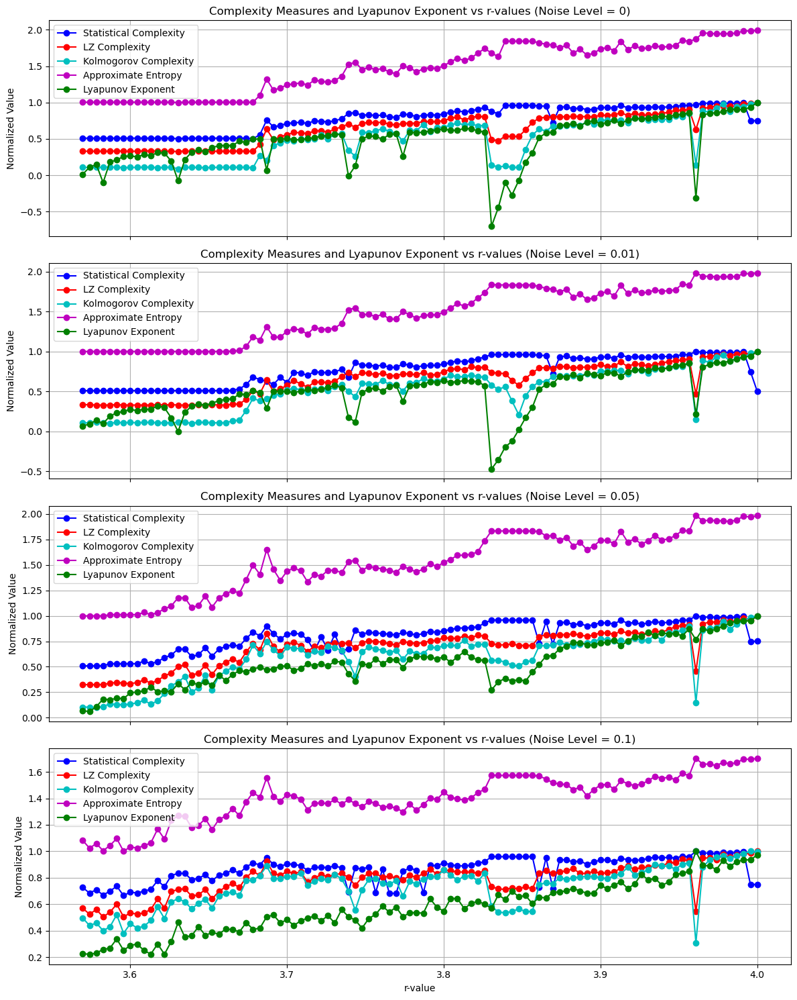

In [57]:
# Parameters for logistic map
r_values = np.linspace(3.57, 4.0, 100)  # Including values slightly greater than 4
segment_length = 1000
x0 = np.random.rand()
noise_levels = [0, 0.01, 0.05, 0.1]

# Store results for plotting
stat_complexities = {nl: [] for nl in noise_levels}
lz_complexities = {nl: [] for nl in noise_levels}
kolmogorov_complexities = {nl: [] for nl in noise_levels}
approx_entropy_values = {nl: [] for nl in noise_levels}
lyapunov_exponents = {nl: [] for nl in noise_levels}

for noise_level in noise_levels:
    for r in r_values:
        logistic_data = logistic_map(r, x0, segment_length)
        noisy_data = add_white_noise(logistic_data, noise_level)
        
        if np.isnan(noisy_data).any():
            stat_complexities[noise_level].append(np.nan)
            lz_complexities[noise_level].append(np.nan)
            kolmogorov_complexities[noise_level].append(np.nan)
            approx_entropy_values[noise_level].append(np.nan)
            lyapunov_exponents[noise_level].append(np.nan)
            continue  # Skip this r value if overflow occurred
        
        binary_data = binarize_data(noisy_data, np.median(noisy_data))
        binary_string = ''.join(map(str, binary_data))

        # Calculate complexities
        stat_complexity = calculate_statistical_complexity(binary_string, lambda_val=2, sigma_val=0.05)
        lz_complexity = LZc_binary(binary_string)
        kolmogorov_complexity = calculate_kolmogorov_complexity(binary_string)
        approx_entropy_value = approximate_entropy(np.array(list(map(int, binary_string))), m=2, r=0.2)
        
        # Calculate Lyapunov exponent
        lyapunov_exp = calculate_lyapunov_exponent(noisy_data, r)
        
        stat_complexities[noise_level].append(stat_complexity)
        lz_complexities[noise_level].append(lz_complexity)
        kolmogorov_complexities[noise_level].append(kolmogorov_complexity)
        approx_entropy_values[noise_level].append(approx_entropy_value)
        lyapunov_exponents[noise_level].append(lyapunov_exp)

# Normalize complexities for better visualization
def normalize(values):
    max_val = np.nanmax(values)
    return [val / max_val if not np.isnan(val) else np.nan for val in values]

# Plot complexity measures for different noise levels
fig, axs = plt.subplots(len(noise_levels), 1, figsize=(12, 15), sharex=True)

for i, noise_level in enumerate(noise_levels):
    axs[i].plot(r_values, normalize(stat_complexities[noise_level]), 'bo-', label='Statistical Complexity')
    axs[i].plot(r_values, normalize(lz_complexities[noise_level]), 'ro-', label='LZ Complexity')
    axs[i].plot(r_values, normalize(kolmogorov_complexities[noise_level]), 'co-', label='Kolmogorov Complexity')
    axs[i].plot(r_values, normalize(approx_entropy_values[noise_level]), 'mo-', label='Approximate Entropy')
    axs[i].plot(r_values, normalize(lyapunov_exponents[noise_level]), 'go-', label='Lyapunov Exponent')
    axs[i].set_title(f'Complexity Measures and Lyapunov Exponent vs r-values (Noise Level = {noise_level})')
    axs[i].set_ylabel('Normalized Value')
    axs[i].legend()
    axs[i].grid(True)

axs[-1].set_xlabel('r-value')
plt.tight_layout()
plt.show()

### Quantitative Analysis:

Perform statistical analysis to quantify the impact of noise on the complexity measures.

1. **Calculate Means and Standard Deviations**:
   - Calculate the mean and standard deviation of each complexity measure and the Lyapunov exponent for each noise level.

2. **Perform t-tests**:
   - Perform t-tests to compare the complexity measures between different noise levels.

3. **Visualize Results**:
   - Visualize the results using bar plots or box plots to compare the distributions of complexity measures across different noise levels.
   

#### 1: Calculate Means and Standard Deviations

In [59]:
# Calculate means and standard deviations
mean_std_data = {nl: {} for nl in noise_levels}

for noise_level in noise_levels:
    mean_std_data[noise_level]['stat_complexity'] = (np.nanmean(stat_complexities[noise_level]), np.nanstd(stat_complexities[noise_level]))
    mean_std_data[noise_level]['lz_complexity'] = (np.nanmean(lz_complexities[noise_level]), np.nanstd(lz_complexities[noise_level]))
    mean_std_data[noise_level]['kolmogorov_complexity'] = (np.nanmean(kolmogorov_complexities[noise_level]), np.nanstd(kolmogorov_complexities[noise_level]))
    mean_std_data[noise_level]['approx_entropy'] = (np.nanmean(approx_entropy_values[noise_level]), np.nanstd(approx_entropy_values[noise_level]))
    mean_std_data[noise_level]['lyapunov_exponent'] = (np.nanmean(lyapunov_exponents[noise_level]), np.nanstd(lyapunov_exponents[noise_level]))

# Print the results
for noise_level in noise_levels:
    print(f"Noise Level = {noise_level}")
    for measure in mean_std_data[noise_level]:
        mean, std = mean_std_data[noise_level][measure]
        print(f"{measure}: Mean = {mean:.3f}, Std = {std:.3f}")
    print()

Noise Level = 0
stat_complexity: Mean = 1.548, Std = 0.356
lz_complexity: Mean = 125.920, Std = 42.756
kolmogorov_complexity: Mean = 99.340, Std = 60.125
approx_entropy: Mean = -1.023, Std = 0.237
lyapunov_exponent: Mean = 0.330, Std = 0.220

Noise Level = 0.01
stat_complexity: Mean = 1.546, Std = 0.360
lz_complexity: Mean = 128.670, Std = 42.087
kolmogorov_complexity: Mean = 106.960, Std = 56.544
approx_entropy: Mean = -1.029, Std = 0.238
lyapunov_exponent: Mean = 0.341, Std = 0.197

Noise Level = 0.05
stat_complexity: Mean = 1.615, Std = 0.296
lz_complexity: Mean = 139.260, Std = 36.560
kolmogorov_complexity: Mean = 125.620, Std = 49.661
approx_entropy: Mean = -1.065, Std = 0.210
lyapunov_exponent: Mean = 0.370, Std = 0.150

Noise Level = 0.1
stat_complexity: Mean = 1.730, Std = 0.192
lz_complexity: Mean = 156.200, Std = 24.007
kolmogorov_complexity: Mean = 151.130, Std = 32.571
approx_entropy: Mean = -1.142, Std = 0.148
lyapunov_exponent: Mean = 0.395, Std = 0.136



#### 2. Perform t-tests

In [61]:
# Perform t-tests between different noise levels
t_test_results = {}

for nl1 in noise_levels:
    for nl2 in noise_levels:
        if nl1 < nl2:
            t_test_results[(nl1, nl2)] = {}
            t_stat, p_val = stats.ttest_ind(stat_complexities[nl1], stat_complexities[nl2], nan_policy='omit')
            t_test_results[(nl1, nl2)]['stat_complexity'] = (t_stat, p_val)
            
            t_stat, p_val = stats.ttest_ind(lz_complexities[nl1], lz_complexities[nl2], nan_policy='omit')
            t_test_results[(nl1, nl2)]['lz_complexity'] = (t_stat, p_val)
            
            t_stat, p_val = stats.ttest_ind(kolmogorov_complexities[nl1], kolmogorov_complexities[nl2], nan_policy='omit')
            t_test_results[(nl1, nl2)]['kolmogorov_complexity'] = (t_stat, p_val)
            
            t_stat, p_val = stats.ttest_ind(approx_entropy_values[nl1], approx_entropy_values[nl2], nan_policy='omit')
            t_test_results[(nl1, nl2)]['approx_entropy'] = (t_stat, p_val)
            
            t_stat, p_val = stats.ttest_ind(lyapunov_exponents[nl1], lyapunov_exponents[nl2], nan_policy='omit')
            t_test_results[(nl1, nl2)]['lyapunov_exponent'] = (t_stat, p_val)

# Print t-test results
for (nl1, nl2) in t_test_results:
    print(f"t-test between Noise Levels {nl1} and {nl2}")
    for measure in t_test_results[(nl1, nl2)]:
        t_stat, p_val = t_test_results[(nl1, nl2)][measure]
        print(f"{measure}: t = {t_stat:.3f}, p = {p_val:.3f}")
    print()

t-test between Noise Levels 0 and 0.01
stat_complexity: t = 0.044, p = 0.965
lz_complexity: t = -0.456, p = 0.649
kolmogorov_complexity: t = -0.919, p = 0.359
approx_entropy: t = 0.181, p = 0.857
lyapunov_exponent: t = -0.391, p = 0.696

t-test between Noise Levels 0 and 0.05
stat_complexity: t = -1.436, p = 0.152
lz_complexity: t = -2.359, p = 0.019
kolmogorov_complexity: t = -3.353, p = 0.001
approx_entropy: t = 1.315, p = 0.190
lyapunov_exponent: t = -1.505, p = 0.134

t-test between Noise Levels 0 and 0.1
stat_complexity: t = -4.475, p = 0.000
lz_complexity: t = -6.144, p = 0.000
kolmogorov_complexity: t = -7.536, p = 0.000
approx_entropy: t = 4.233, p = 0.000
lyapunov_exponent: t = -2.506, p = 0.013

t-test between Noise Levels 0.01 and 0.05
stat_complexity: t = -1.476, p = 0.142
lz_complexity: t = -1.890, p = 0.060
kolmogorov_complexity: t = -2.467, p = 0.014
approx_entropy: t = 1.122, p = 0.263
lyapunov_exponent: t = -1.154, p = 0.250

t-test between Noise Levels 0.01 and 0.1
st